Notebook created on 25/06/2025 to investigate EUl small domain MAR3.14-MPI sim

In [1]:
import xarray as xr
#import rioxarray as rxr
import xesmf as xe
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter

from pyproj import CRS,Transformer,Proj

import sys
sys.path.insert(1, '/home/castelli/Notebooks/PhD/utils') # to include my util file in previous directory
import utils as u
u.check_python_version()

3.10.13 | packaged by conda-forge | (main, Oct 26 2023, 18:07:37) [GCC 12.3.0]


In [2]:
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-EC-Earth3/MARgrid_EUe.nc')

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
lon = np.array(ds.LON[jmin:jmax,imin:imax])
lat = np.array(ds.LAT[jmin:jmax,imin:imax])
H = np.array(ds.SH[jmin:jmax,imin:imax])
nlat,nlon = 91, 139

normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
big_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
              'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[41.,50],'lonlim':[0.,20.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False, 'lonlines':2,
                    'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}

months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

veg_mar = ['No Veg.', # 0
           'Crops Low', # 1
           'Crops Medium', # 2
           'Crops High', # 3
           'Grass low', # 4
           'Grass Medium', # 5
           'Grass High', # 6
           'Broadleaf Low', # 7
           'Broadleaf Medium', # 8
           'Broadleaf High', # 9
           'Needle Low', # 10
           'Needle Medium', # 11
           'Needle High', # 12
           'City'] # 13

In [3]:
ds_small = xr.open_dataset('/bettik/castelli/MARout/EUh/h01/2015/ICE.h01.2015.01.01-31.nc')[["LON","LAT","SH","FRV","VEG"]]


In [4]:
def detect_alps(H):
    nlat,nlon = np.shape(H)
    mask = np.bool_(np.zeros((nlat,nlon)))
    r = 4
    for j in range(r,nlat-r):
        for i in range(r,nlon-r):
            mask[j,i] = np.logical_and(H[j,i]>360 ,np.any(H[j-r:j+r,i-r:i+r]>1300))
            # mask[j,i] = np.std(H[j-r:j+r,i-r:i+r])>200
    return mask
alps = detect_alps(H)
alps[lon<4.8] = False
alps[np.logical_and(lon>10,lat<45.2)] = False

alps_month = np.repeat(alps[np.newaxis,:,:],12,axis=0)


In [5]:
def open_monthly_data_ave(vars,year,month,days_in_month,sim,timestep_in_hours = 2,imin = 32,imax = -30,jmin = 20,jmax = -15,whichpath='castelli',
                         ds_sect = xr.open_dataset('/bettik/castelli/MARout/EUh/h01/2015/ICE.h01.2015.01.01-31.nc')[["LON","LAT","SH","FRV","VEG"]]):
    # average of mosaics
    # example of vars : ["GF","SWU","SWD","HAcc","LWU","LWD","SHF","LHF","HA_col","MBm","MBr","MBmTop","MBrTop","MB","MBrr","SAbs_v","SAbs","CC","CU","CM","CD",
    #                    "QQz","TTz","ST","SWt"]
    if whichpath=='castelli':
        path = '/bettik/castelli/MARout/EU'
    else:
        path = '/bettik/menegozm/MARout/EU'
    letter = sim[0]
    code = sim[1:]

    ds_day = xr.open_dataset(path+letter+'/'+letter+code+'/'+year+'/ICE.'+letter+code+'.'+year+'.'+month+'.01-'+days_in_month+'.nc')[vars].isel(x=slice(imin,imax),
                                                                                                                                                    y=slice(jmin,jmax))
    # Melt
    Lf = 3.34*10**5 # J.kg**(-1) the latent heat of fusion of water
    t_timestep = 60*60*timestep_in_hours # 60*60*24 seconds in a day
    if('MBm' in vars):
        melt_MBm = ds_day.MBm.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBm.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBm.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100 # in mm = L.m**(-2) = kg.m**(-2) because for liquid water 1L=1kg
        ds_day_melt = melt_MBm * Lf / t_timestep # kg.m**(-2) * J.kg**(-1) / s = J/s.m**(-2) = W.m**(-2)
        ds_day['melt'] = -ds_day_melt # minus sign because energy is LOST by surface in order to melt snow
    if('MBr' in vars):
        freez_MBr = ds_day.MBr.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBr.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MBr.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez = freez_MBr * Lf / t_timestep
        ds_day['freeze'] = ds_day_freez
    if('MBmTop' in vars):
        melt_MBm_top = ds_day.MBmTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBmTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBmTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_melt_top = melt_MBm_top * Lf / t_timestep
        ds_day['melt_top'] = -ds_day_melt_top
    if('MBrTop' in vars):
        freez_MBr_top = ds_day.MBrTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBrTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBrTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez_top = freez_MBr_top * Lf / t_timestep
        ds_day['freeze_top'] = ds_day_freez_top
    if('MB' in vars):
        average_snow = ds_day.MB.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MB.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MB.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day['MBave'] = average_snow
    
    if('SWD' in vars and 'SWU' in vars):
        ds_day['NSW'] = ds_day.SWD - ds_day.SWU
    if('LWD' in vars and 'LWU' in vars):
        ds_day['NLW'] = ds_day.LWD - ds_day.LWU
    if('TTz' in vars):
        ds_day['TT2'] = ds_day.TTz.sel(ztqlev=2.0)
    if('SWt' in vars):
        ds_day['SWt'] = -ds_day['SWt'] # - sign because the energy transmitted to lower layers is LOST by the surface
    if('MBrr' in vars and 'MBsf' in vars):
        ds_day['precip'] = ds_day.MBrr + ds_day.MBsf
    
    if('SWD' in vars and 'SWU' in vars and 'LWD' in vars and 'LWU' in vars and 'SHF' in vars and 'LHF' in vars and 'MBmTop' in vars and 'MBrTop' in vars and 'GF' in vars
       and 'HAcc' in vars and 'SWt' in vars):
        ds_day_surf_balance = ds_day.NSW + ds_day.NLW + ds_day.SHF + ds_day.LHF + ds_day.melt_top + ds_day.freeze_top + ds_day.GF + ds_day.HAcc + ds_day.SWt
        ds_day['Surf_Bal'] = ds_day_surf_balance

    return ds_day

In [6]:
def open_monthly_data_k(vars,year,month,days_in_month,sim,timestep_in_hours = 2,imin = 32,imax = -30,jmin = 20,jmax = -15,whichpath='castelli'):
    # example of vars : ["GF","SWU","SWD","HAcc","LWU","LWD","SHF","LHF","HA_col","MBm","MBr","MBmTop","MBrTop","MB","MBrr","SAbs_v","SAbs","CC","CU","CM","CD",
    #                    "QQz","TTz","ST","SWt"]
    
    if whichpath=='castelli':
        path = '/bettik/castelli/MARout/EU'
    else:
        path = '/bettik/menegozm/MARout/EU'
    letter = sim[0]
    code = sim[1:]

    ds_day = xr.open_dataset(path+letter+'/'+letter+code+'/'+year+'/ICE.'+letter+code+'.'+year+'.'+month+'.01-'+days_in_month+'.nc')[vars].isel(x=slice(imin,imax),
                                                                                                                                                    y=slice(jmin,jmax))
    
    # Melt
    Lf = 3.34*10**5 # J.kg**(-1) the latent heat of fusion of water
    t_timestep = 60*60*timestep_in_hours # 60*60*24 seconds in a day
    ds_day_melt = ds_day.MBm * Lf / t_timestep # kg.m**(-2) * J.kg**(-1) / s = J/s.m**(-2) = W.m**(-2)
    ds_day_freez = ds_day.MBr * Lf / t_timestep
    ds_day_melt_top = ds_day.MBmTop * Lf / t_timestep
    ds_day_freez_top = ds_day.MBrTop * Lf / t_timestep


    ds_day['NSWk'] = ds_day.SWD - ds_day.SWUk
    ds_day['NLWk'] = ds_day.LWD - ds_day.LWUk
    ds_day['meltk'] = -ds_day_melt # minus sign because energy is LOST by surface in order to melt snow
    ds_day['freezek'] = ds_day_freez
    ds_day['melt_topk'] = -ds_day_melt_top
    ds_day['freeze_topk'] = ds_day_freez_top
    ds_day['TT2'] = ds_day.TTz.sel(ztqlev=2.0)
    ds_day['SWtk'] = -ds_day['SWtk'] # - sign because the energy transmitted to lower layers is LOST by the surface

    ds_day_surf_balance = ds_day.NSWk + ds_day.NLWk + ds_day.SHFk + ds_day.LHFk + ds_day.melt_topk + ds_day.freeze_topk + ds_day.GFk + ds_day.HAcck + ds_day.SWtk
    ds_day['Surf_Balk'] = ds_day_surf_balance

    return ds_day

In [7]:
def plot_comparison(var,list_ds,months,min,max,colormap,label_var,suptitle_var,ds_size=ds_small):

    f, axs = pplt.subplots(proj='cyl',axwidth=2,ncols=4,nrows=2,axheight=1.)

    for mon in range(len(list_ds)):    
        ax=axs[mon]
        m = ax.pcolormesh(ds_size.LON,ds_size.LAT,list_ds[mon],levels=np.linspace(min,max,11),cmap=colormap)
        ax.format(title=months[mon])

    f.colorbar(m,label= label_var,labelsize='large',ticklabelsize='large')
    axs.format(**multiplot_format,suptitle=suptitle_var)

In [8]:
def plot_monthly_2points(ds_var,first,last,iloc1,jloc1,iloc2,jloc2,ymin,ymax,names_var,colors):
# ------------------------------------------------- Map ------------------------------------------------
        
    colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
    f, ax = pplt.subplots(proj='cyl', axwidth=5)
    m=ax.pcolormesh(ds_small.LON, ds_small.LAT, ds_small.SH, levels=17,cmap=colors_land)
    f.colorbar(m,label= 'm.a.s.l.',labelsize='large',ticklabelsize='large')

    ax.plot(ds_small.LON[iloc1,jloc1], ds_small.LAT[iloc1,jloc1],'rx',markersize=8,markeredgewidth=1.5)
    ax.plot(ds_small.LON[iloc2,jloc2], ds_small.LAT[iloc2,jloc2],'bx',markersize=8,markeredgewidth=1.5)

    ax.format(**normal_format)
    ax.format(ocean=True,oceancolor='royalblue',reso='hi')

# ------------------------------------------------- Time series plots ------------------------------------------------

    #longitude_point = round(float(lon[iloc,jloc]),2)
    #latitude_point = round(float(lat[iloc,jloc]),2)
    f, axs = pplt.subplots(axwidth=5,axheight=0.4,ncols=2,nrows=2,hratios=(1,5),ref=1,sharey=False)
    pplt.rc.update(small=10, large=12)
    
    #ds_var_ave['Surf_Bal_HA_col'] = ds_var_ave.NSW + ds_var_ave.NLW + ds_var_ave.SHF + ds_var_ave.LHF + ds_var_ave.melt + ds_var_ave.freeze + ds_var_ave.HA_col
    #ds_var['Surf_Bal_HA_colk'] = ds_var.NSWk + ds_var.NLWk + ds_var.SHFk + ds_var.LHFk + ds_var.meltk + ds_var.freezek + ds_var.HA_colk

    for i,var in enumerate(names_var):
        if(var=='Surf_Bal' or var=='Surf_Bal_HA_col'):
            line_width=2.5
        else:
            line_width=1
        ax=axs[2]
        ax.set_ylim([ymin,ymax])
        ax.format(ylabel='W/$m^2$')
        ax.scatter(ds_var.month[first:last], np.array(ds_var[var])[first:last,iloc1,jloc1], c=colors[i], s=10)
        ax.plot(ds_var.month[first:last], np.array(ds_var[var])[first:last,iloc1,jloc1], c=colors[i],linewidth=line_width)
        
        ax=axs[3]
        ax.set_ylim([ymin,ymax])
        ax.scatter(ds_var.month[first:last], np.array(ds_var[var])[first:last,iloc2,jloc2], c=colors[i], s=10)
        ax.plot(ds_var.month[first:last], np.array(ds_var[var])[first:last,iloc2,jloc2], c=colors[i],linewidth=line_width,label=var)


    max_MB = max(np.array(ds_var['MB'])[first:last,:,iloc1,jloc1].max(), np.array(ds_var['MB'])[:,first:last,iloc2,jloc2].max())
    ax=axs[0]
    ax.format(title='Point 1',ylabel='Snow \n(mmWe)')
    ax.set_ylim([-0.1,max_MB])
    ax.plot(ds_var.month[first:last], np.array(ds_var['MB'].max(axis=1))[first:last,iloc1,jloc1], c='skyblue',linewidth=line_width)

    max_MB = np.array(ds_var['MB'])[first:last,:,iloc2,jloc2].max()
    ax=axs[1]
    ax.format(title='Point 2')
    ax.plot(ds_var.month[first:last], np.array(ds_var['MB'].max(axis=1))[first:last,iloc2,jloc2], c='skyblue',linewidth=line_width)

    #f.format(titlesize='20px',suptitle=f'Gridpoint (lon {longitude_point}°, lat {latitude_point}°)')
    f.legend(loc='b',prop = { "size": 10 },ncols=4)

In [9]:
# MARv3.10
name_GCM = 'MPI-ESM1-2-HR'
code_GCM = 'MPI-ESM'
scenario = 'SSP585'
sim = 'EUy'
sim2 = 'EUy'
data_freq = 'daily'
data_freq_prefix = 'ICE' # ICE for daily, MON for monthly
year = 2015

ssp585_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+'.TTz.'+str(year)+'.nc'
ds_EUy2015 = xr.open_dataset(ssp585_path)


ds_EUy2015['CC'] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.CC.'+str(year)+'.nc').CC
ds_EUy2015["MBrr"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBrr.'+str(year)+'.nc').MBrr
ds_EUy2015["MBsf"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBsf.'+str(year)+'.nc').MBsf
ds_EUy2015["SWD"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.SWD.'+str(year)+'.nc').SWD
ds_EUy2015["QQz"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.QQz.'+str(year)+'.nc').QQz
ds_EUy2015["ST"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.ST.'+str(year)+'.nc').ST
ds_EUy2015["TTp"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.TTp.'+str(year)+'.nc').TTp

ds_EUy2015["precip"] = ds_EUy2015["MBrr"] + ds_EUy2015["MBsf"]

In [10]:
scenario = 'HIST'
year = 2014

ssp585_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+'.TTz.'+str(year)+'.nc'
ds_EUy2014 = xr.open_dataset(ssp585_path)


ds_EUy2014['CC'] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.CC.'+str(year)+'.nc').CC
ds_EUy2014["MBrr"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBrr.'+str(year)+'.nc').MBrr
ds_EUy2014["MBsf"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBsf.'+str(year)+'.nc').MBsf
ds_EUy2014["SWD"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.SWD.'+str(year)+'.nc').SWD
ds_EUy2014["QQz"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.QQz.'+str(year)+'.nc').QQz
ds_EUy2014["ST"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.ST.'+str(year)+'.nc').ST
ds_EUy2014["TTp"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.TTp.'+str(year)+'.nc').TTp

ds_EUy2014["precip"] = ds_EUy2014["MBrr"] + ds_EUy2014["MBsf"]

### MAR-MPI : big domain MARv3.10 vs small domain MARv3.14

l01 : marmagic_mod parameters are the same as for my first simulations where I didn't touch them, which is :
humidity_magic = 15.
cloud_magic = 0.1
correction_humidity_boundary = 0.0
rain_snow_limit = 273.15

l02 : marmagic_mod parameters are the same as for MARv3.10 sims done by Julien and Martin (see /bettik/menegozm/MARout/Julien/EUy/y01/code/MARmagic.inc)
humidity_magic = 20.
cloud_magic = 0.00
correction_humidity_boundary = 0.0
rain_snow_limit = 273.15

l03 : humidity_magic = 15.
cloud_magic = 0.1
correction_humidity_boundary = 0.1
rain_snow_limit = 273.15

In [9]:
vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","QQz","TTz","ST","TTp"]

ds_EUl012014_09_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='09',days_in_month='30',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012014_10_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='10',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012014_11_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='11',days_in_month='30',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012014_12_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='12',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')

In [12]:
#vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"]
vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","QQz","TTz","ST","TTp"]

ds_EUl012015_01_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='01',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_02_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='02',days_in_month='28',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_03_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='03',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_04_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='04',days_in_month='30',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_05_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='05',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_06_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='06',days_in_month='30',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_07_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='07',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_08_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='08',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_09_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='09',days_in_month='30',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_10_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='10',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_11_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='11',days_in_month='30',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl012015_12_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='12',days_in_month='31',sim='l01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')

In [15]:
ds_EUl022015_01_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='01',
                                            days_in_month='31',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl022015_02_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='02',
                                            days_in_month='28',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl022015_03_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='03',
                                            days_in_month='31',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl022015_04_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='04',
                                            days_in_month='30',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl022015_05_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='05',
                                            days_in_month='31',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl022015_06_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='06',
                                            days_in_month='30',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl022015_07_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='07',
                                            days_in_month='31',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl022015_08_ave = open_monthly_data_ave(vars=["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBrr","MBsf","CC","CU","CM","CD","QQz","TTz","ST"],year='2015',month='08',
                                            days_in_month='31',sim='l02',timestep_in_hours = 4,
                                      imin = 0, imax = -1, jmin = 0, jmax = -1, whichpath='castelli')

In [13]:
vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","QQz","TTz","ST","TTp"]

ds_EUl032014_09_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='09',days_in_month='30',sim='l03',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl032014_10_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='10',days_in_month='31',sim='l03',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl032014_11_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='11',days_in_month='30',sim='l03',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl032014_12_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='12',days_in_month='31',sim='l03',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')

In [28]:
ds_EUy2015

<xarray.Dataset>
Dimensions:  (time: 365, ztqlev: 4, y: 126, x: 201, plev: 7)
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01T12:00:00 ... 2015-12-31T12:00:00
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
  * ztqlev   (ztqlev) float32 2.0 10.0 50.0 100.0
  * plev     (plev) float32 925.0 850.0 800.0 700.0 600.0 500.0 200.0
Data variables:
    TTz      (time, ztqlev, y, x) float32 ...
    CC       (time, y, x) float32 ...
    MBrr     (time, y, x) float32 ...
    MBsf     (time, y, x) float32 ...
    SWD      (time, y, x) float32 ...
    QQz      (time, ztqlev, y, x) float32 ...
    ST       (time, y, x) float32 ...
    TTp      (time, plev, y, x) float32 ...
    precip   (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        ICE - Exp: y56 - 20150101
    institution:  ULg (Xavier Fettweis)
    history:      Fri Jan 29 23:53:18 2021: ncks -v TTz ICE.y56.2015.01.01-31...
    netcdf:       4.1.1 of Feb 12 2011 08:44:29 $
    NCO:          4.0.9

In [29]:
ds_small.coords['lon'] = ds_small.LON
ds_small.coords['lat'] = ds_small.LAT

In [30]:
# Regridding MARv3.10 onto small domain

# MAR has a very slight difference in x and y positions of grid cells between MARgrid and the simulations, which will prevent the regridding. So have to do this :
lon_correct_xy = ds.LON # copy the incorrect lon/lat
lat_correct_xy = ds.LAT
#lat_correct_xy = ds.LAT[jmin:jmax,imin:imax]

lon_correct_xy["x"] = ("x", ds_EUy2015.x.values) # correct lon
lon_correct_xy["y"] = ("y", ds_EUy2015.y.values)

lat_correct_xy["x"] = ("x", ds_EUy2015.x.values) # correct lat
lat_correct_xy["y"] = ("y", ds_EUy2015.y.values)

ds_EUy2015.coords['lon'] = lon_correct_xy
ds_EUy2015.coords['lat'] = lat_correct_xy

ds_EUy2015_regrid = u.regrid(ds_EUy2015,ds_small,'bilinear',globe=True,periodic=False,reuse_weights=False)

In [14]:
ds_EUy2015_month = ds_EUy2015.groupby("time.month").mean()
ds_EUy2015_regrid_month = ds_EUy2015_regrid.groupby("time.month").mean()

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

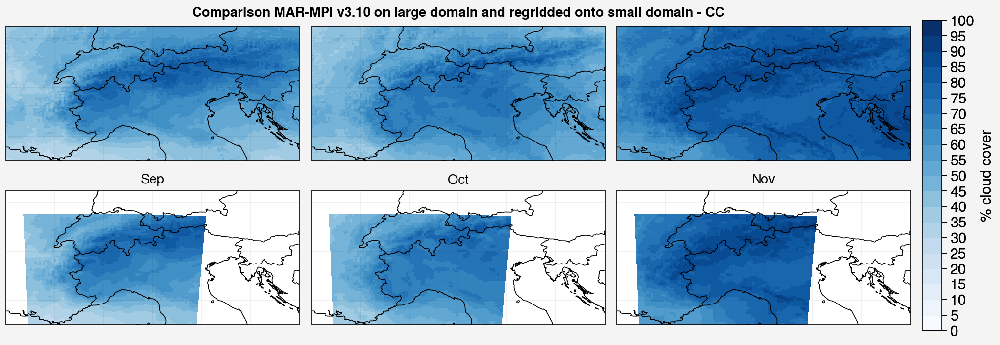

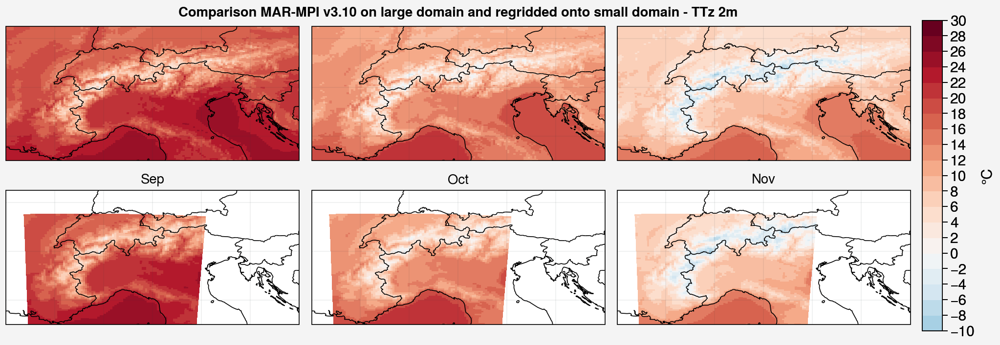

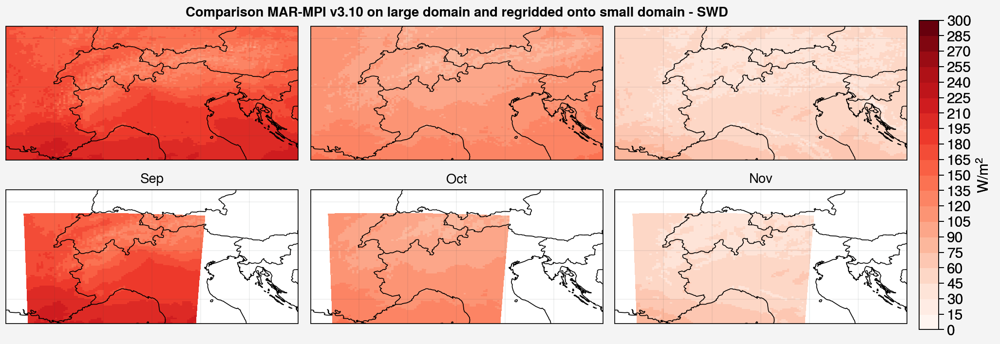

In [73]:
# Test to see if regrid worked well

f, axs = pplt.subplots(proj='cyl',axwidth=3,ncols=3,nrows=2,axheight=1.5)

months = ['Sep','Oct','Nov']


for mon in range(3):
    ax=axs[mon]
    m = ax.pcolormesh(ds.LON,ds.LAT,100*ds_EUy2015_month.CC[mon+8],levels=np.linspace(0,100,21),cmap='Blues')
    
    ax=axs[mon+3]
    m = ax.pcolormesh(ds_small.LON,ds_small.LAT,100*ds_EUy2015_regrid_month.CC[mon+8],levels=np.linspace(0,100,21),cmap='Blues')
    ax.format(title=months[mon])


f.colorbar(m,label= '% cloud cover',labelsize='large',ticklabelsize='large')
axs.format(**multiplot_format,suptitle='Comparison MAR-MPI v3.10 on large domain and regridded onto small domain - CC')

# --------------------------------------------------

f, axs = pplt.subplots(proj='cyl',axwidth=3,ncols=3,nrows=2,axheight=1.5)

for mon in range(3):
    ax=axs[mon]
    m = ax.pcolormesh(ds.LON,ds.LAT,ds_EUy2015_month.TTz.isel(ztqlev=0)[mon+8],levels=np.linspace(-10,30,21),cmap='RdBu_r')
    
    ax=axs[mon+3]
    m = ax.pcolormesh(ds_small.LON,ds_small.LAT,ds_EUy2015_regrid_month.TTz.isel(ztqlev=0)[mon+8],levels=np.linspace(-10,30,21),cmap='RdBu_r')
    ax.format(title=months[mon])


f.colorbar(m,label= '°C',labelsize='large',ticklabelsize='large')
axs.format(**multiplot_format,suptitle='Comparison MAR-MPI v3.10 on large domain and regridded onto small domain - TTz 2m')

# --------------------------------------------------

f, axs = pplt.subplots(proj='cyl',axwidth=3,ncols=3,nrows=2,axheight=1.5)

for mon in range(3):
    ax=axs[mon]
    m = ax.pcolormesh(ds.LON,ds.LAT,ds_EUy2015_month.SWD[mon+8],levels=np.linspace(0,300,21),cmap='Reds')
    
    ax=axs[mon+3]
    m = ax.pcolormesh(ds_small.LON,ds_small.LAT,ds_EUy2015_regrid_month.SWD[mon+8],levels=np.linspace(0,300,21),cmap='Reds')
    ax.format(title=months[mon])


f.colorbar(m,label= 'W/$m^2$',labelsize='large',ticklabelsize='large')
axs.format(**multiplot_format,suptitle='Comparison MAR-MPI v3.10 on large domain and regridded onto small domain - SWD')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

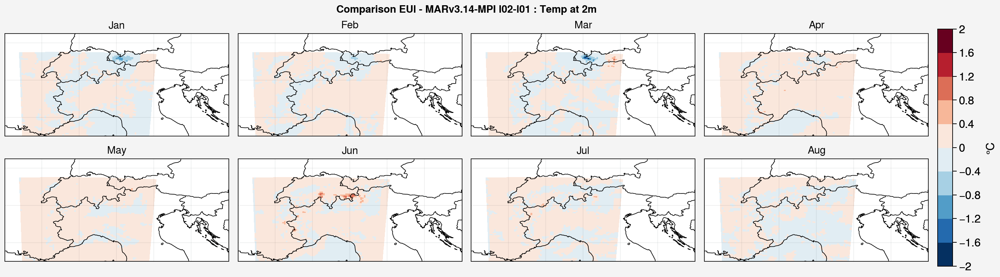

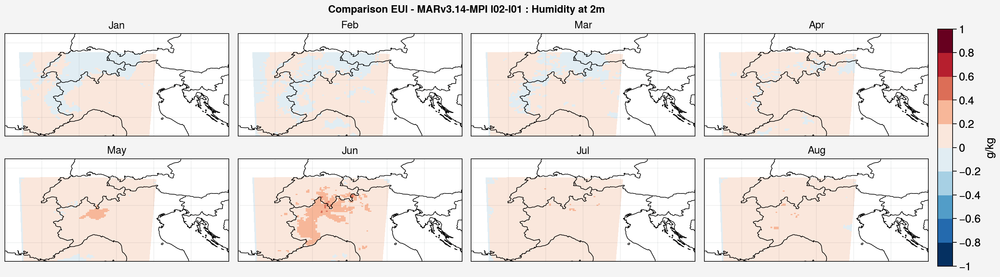

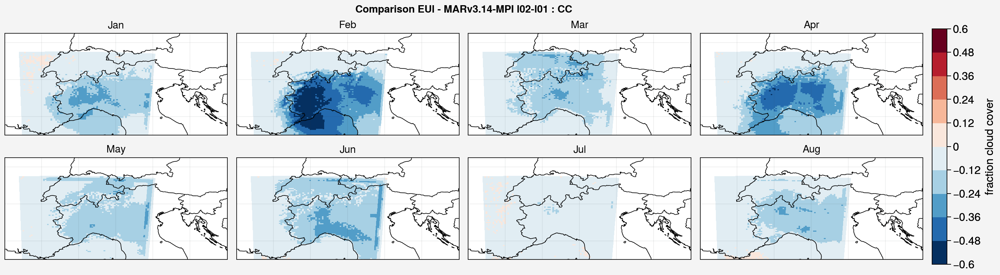

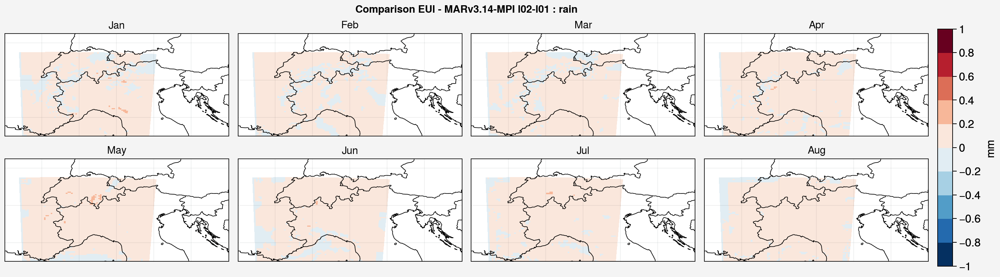

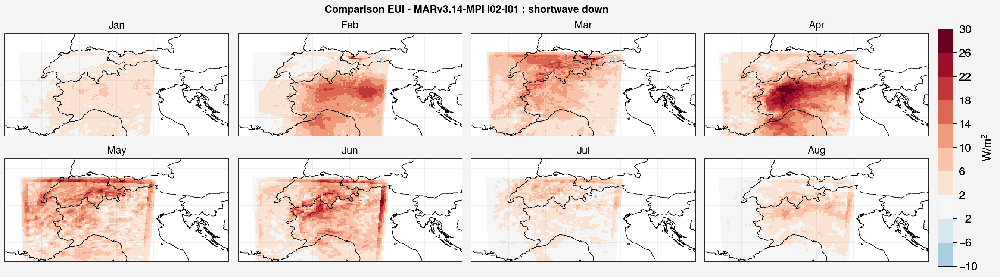

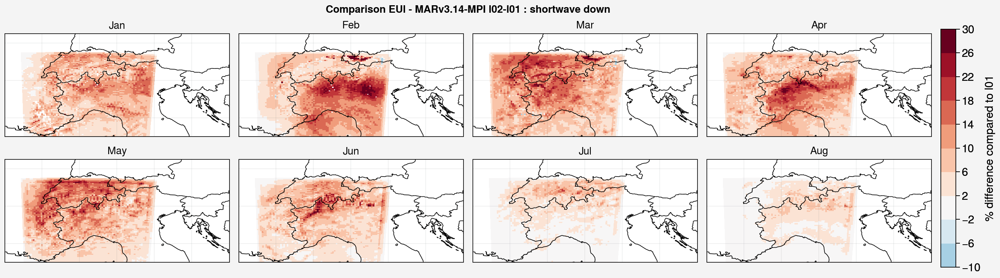

In [63]:
var = "TT2"
plot_comparison(var= "TT2",list_ds = [ds_EUl022015_01_ave[var] - ds_EUl012015_01_ave[var], ds_EUl022015_02_ave[var] - ds_EUl012015_02_ave[var],
                                      ds_EUl022015_03_ave[var] - ds_EUl012015_03_ave[var], ds_EUl022015_04_ave[var] - ds_EUl012015_04_ave[var],
                                      ds_EUl022015_05_ave[var] - ds_EUl012015_05_ave[var], ds_EUl022015_06_ave[var] - ds_EUl012015_06_ave[var],
                                      ds_EUl022015_07_ave[var] - ds_EUl012015_07_ave[var], ds_EUl022015_08_ave[var] - ds_EUl012015_08_ave[var]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -2,max = 2,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-l01 : Temp at 2m')

# --------------------------------------------

var = "QQz"
plot_comparison(var= "TT2",list_ds = [ds_EUl022015_01_ave[var].isel(ztqlev=0) - ds_EUl012015_01_ave[var].isel(ztqlev=0),
                                      ds_EUl022015_02_ave[var].isel(ztqlev=0) - ds_EUl012015_02_ave[var].isel(ztqlev=0),
                                      ds_EUl022015_03_ave[var].isel(ztqlev=0) - ds_EUl012015_03_ave[var].isel(ztqlev=0),
                                      ds_EUl022015_04_ave[var].isel(ztqlev=0) - ds_EUl012015_04_ave[var].isel(ztqlev=0),
                                      ds_EUl022015_05_ave[var].isel(ztqlev=0) - ds_EUl012015_05_ave[var].isel(ztqlev=0),
                                      ds_EUl022015_06_ave[var].isel(ztqlev=0) - ds_EUl012015_06_ave[var].isel(ztqlev=0),
                                      ds_EUl022015_07_ave[var].isel(ztqlev=0) - ds_EUl012015_07_ave[var].isel(ztqlev=0),
                                      ds_EUl022015_08_ave[var].isel(ztqlev=0) - ds_EUl012015_08_ave[var].isel(ztqlev=0)],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -1,max = 1,colormap = 'RdBu_r',label_var = 'g/kg',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-l01 : Humidity at 2m')

# -------------------------------------------
var = "CC"
plot_comparison(var= "CC",list_ds = [ds_EUl022015_01_ave[var] - ds_EUl012015_01_ave[var], ds_EUl022015_02_ave[var] - ds_EUl012015_02_ave[var],
                                      ds_EUl022015_03_ave[var] - ds_EUl012015_03_ave[var], ds_EUl022015_04_ave[var] - ds_EUl012015_04_ave[var],
                                      ds_EUl022015_05_ave[var] - ds_EUl012015_05_ave[var], ds_EUl022015_06_ave[var] - ds_EUl012015_06_ave[var],
                                      ds_EUl022015_07_ave[var] - ds_EUl012015_07_ave[var], ds_EUl022015_08_ave[var] - ds_EUl012015_08_ave[var]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -0.6,max = 0.6,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-l01 : CC')

# -------------------------------------------
var = "MBrr"
plot_comparison(var= "MBrr",list_ds = [ds_EUl022015_01_ave[var] - ds_EUl012015_01_ave[var], ds_EUl022015_02_ave[var] - ds_EUl012015_02_ave[var],
                                      ds_EUl022015_03_ave[var] - ds_EUl012015_03_ave[var], ds_EUl022015_04_ave[var] - ds_EUl012015_04_ave[var],
                                      ds_EUl022015_05_ave[var] - ds_EUl012015_05_ave[var], ds_EUl022015_06_ave[var] - ds_EUl012015_06_ave[var],
                                      ds_EUl022015_07_ave[var] - ds_EUl012015_07_ave[var], ds_EUl022015_08_ave[var] - ds_EUl012015_08_ave[var]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -1,max = 1,colormap = 'RdBu_r',label_var = 'mm',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-l01 : rain')

# -------------------------------------------
var = "SWD"
plot_comparison(var= "SWD",list_ds = [ds_EUl022015_01_ave[var] - ds_EUl012015_01_ave[var], ds_EUl022015_02_ave[var] - ds_EUl012015_02_ave[var],
                                      ds_EUl022015_03_ave[var] - ds_EUl012015_03_ave[var], ds_EUl022015_04_ave[var] - ds_EUl012015_04_ave[var],
                                      ds_EUl022015_05_ave[var] - ds_EUl012015_05_ave[var], ds_EUl022015_06_ave[var] - ds_EUl012015_06_ave[var],
                                      ds_EUl022015_07_ave[var] - ds_EUl012015_07_ave[var], ds_EUl022015_08_ave[var] - ds_EUl012015_08_ave[var]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -10,max = 30,colormap = 'RdBu_r',label_var = 'W/$m^2$',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-l01 : shortwave down')

# -------------------------------------------
var = "SWD"
plot_comparison(var= "SWD",list_ds = [100*(ds_EUl022015_01_ave[var]-ds_EUl012015_01_ave[var])/ds_EUl012015_01_ave[var],
                                      100*(ds_EUl022015_02_ave[var]-ds_EUl012015_02_ave[var])/ds_EUl012015_02_ave[var],
                                      100*(ds_EUl022015_03_ave[var]-ds_EUl012015_03_ave[var])/ds_EUl012015_03_ave[var],
                                      100*(ds_EUl022015_04_ave[var]-ds_EUl012015_04_ave[var])/ds_EUl012015_04_ave[var],
                                      100*(ds_EUl022015_05_ave[var]-ds_EUl012015_05_ave[var])/ds_EUl012015_05_ave[var],
                                      100*(ds_EUl022015_06_ave[var]-ds_EUl012015_06_ave[var])/ds_EUl012015_06_ave[var],
                                      100*(ds_EUl022015_07_ave[var]-ds_EUl012015_07_ave[var])/ds_EUl012015_07_ave[var],
                                      100*(ds_EUl022015_08_ave[var]-ds_EUl012015_08_ave[var])/ds_EUl012015_08_ave[var]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -10,max = 30,colormap = 'RdBu_r',label_var = '% difference compared to l01',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-l01 : shortwave down')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

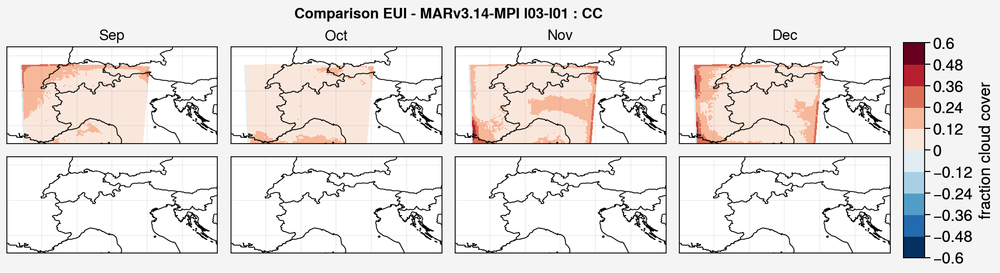

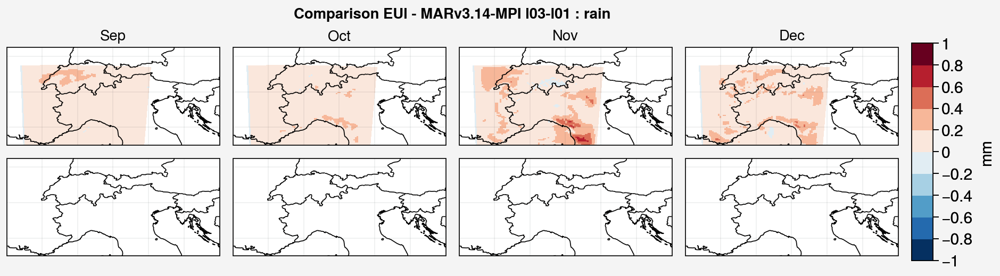

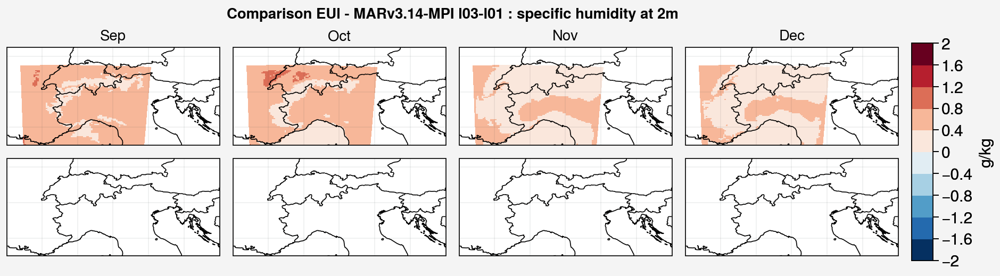

In [16]:
# l03 vs l01

# -------------------------------------------
var = "CC"
plot_comparison(var= "CC",list_ds = [ds_EUl032014_09_ave[var].mean(axis=0) - ds_EUl012014_09_ave[var].mean(axis=0),
                                     ds_EUl032014_10_ave[var].mean(axis=0) - ds_EUl012014_10_ave[var].mean(axis=0),
                                     ds_EUl032014_11_ave[var].mean(axis=0) - ds_EUl012014_11_ave[var].mean(axis=0),
                                     ds_EUl032014_12_ave[var].mean(axis=0) - ds_EUl012014_12_ave[var].mean(axis=0)],
                months = ['Sep','Oct','Nov','Dec'],min = -0.6,max = 0.6,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l03-l01 : CC')

# -------------------------------------------
var = "MBrr"
plot_comparison(var= "MBrr",list_ds = [ds_EUl032014_09_ave[var].mean(axis=0) - ds_EUl012014_09_ave[var].mean(axis=0),
                                     ds_EUl032014_10_ave[var].mean(axis=0) - ds_EUl012014_10_ave[var].mean(axis=0),
                                     ds_EUl032014_11_ave[var].mean(axis=0) - ds_EUl012014_11_ave[var].mean(axis=0),
                                     ds_EUl032014_12_ave[var].mean(axis=0) - ds_EUl012014_12_ave[var].mean(axis=0)],
                months = ['Sep','Oct','Nov','Dec'],min = -1,max = 1,colormap = 'RdBu_r',label_var = 'mm',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l03-l01 : rain')

# -------------------------------------------
var = "QQz"
plot_comparison(var= "QQz",list_ds = [ds_EUl032014_09_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl012014_09_ave[var].isel(ztqlev=0).mean(axis=0),
                                     ds_EUl032014_10_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl012014_10_ave[var].isel(ztqlev=0).mean(axis=0),
                                     ds_EUl032014_11_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl012014_11_ave[var].isel(ztqlev=0).mean(axis=0),
                                     ds_EUl032014_12_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl012014_12_ave[var].isel(ztqlev=0).mean(axis=0)],
                months = ['Sep','Oct','Nov','Dec'],min = -2,max = 2,colormap = 'RdBu_r',label_var = 'g/kg',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l03-l01 : specific humidity at 2m')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

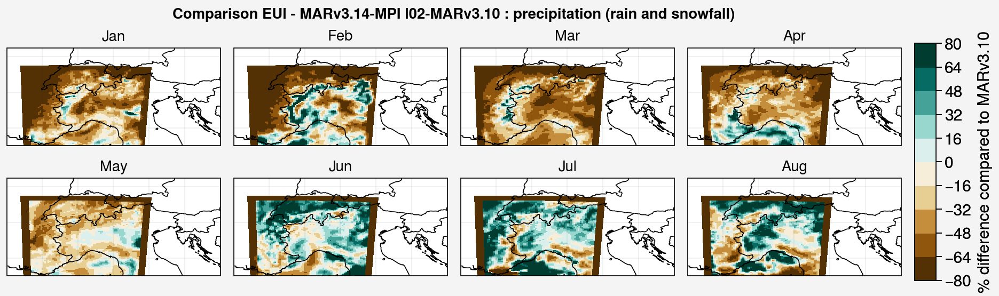

In [16]:
var = "precip"
list_ds1 = [ds_EUl022015_01_ave[var].groupby('time.day').sum(),ds_EUl022015_02_ave[var].groupby('time.day').sum(),ds_EUl022015_03_ave[var].groupby('time.day').sum(),
            ds_EUl022015_04_ave[var].groupby('time.day').sum(),ds_EUl022015_05_ave[var].groupby('time.day').sum(),ds_EUl022015_06_ave[var].groupby('time.day').sum(),
            ds_EUl022015_07_ave[var].groupby('time.day').sum(),ds_EUl022015_08_ave[var].groupby('time.day').sum()]
plot_comparison(var= "precip",list_ds = [100*(list_ds1[0].mean(axis=0) - ds_EUy2015_regrid_month[var][0])/ds_EUy2015_regrid_month[var][0],
                                         100*(list_ds1[1].mean(axis=0) - ds_EUy2015_regrid_month[var][1])/ds_EUy2015_regrid_month[var][1],
                                         100*(list_ds1[2].mean(axis=0) - ds_EUy2015_regrid_month[var][2])/ds_EUy2015_regrid_month[var][2],
                                         100*(list_ds1[3].mean(axis=0) - ds_EUy2015_regrid_month[var][3])/ds_EUy2015_regrid_month[var][3],
                                         100*(list_ds1[4].mean(axis=0) - ds_EUy2015_regrid_month[var][4])/ds_EUy2015_regrid_month[var][4],
                                         100*(list_ds1[5].mean(axis=0) - ds_EUy2015_regrid_month[var][5])/ds_EUy2015_regrid_month[var][5],
                                         100*(list_ds1[6].mean(axis=0) - ds_EUy2015_regrid_month[var][6])/ds_EUy2015_regrid_month[var][6],
                                         100*(list_ds1[7].mean(axis=0) - ds_EUy2015_regrid_month[var][7])/ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -80,max = 80,colormap = 'BrBG',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-MARv3.10 : precipitation (rain and snowfall)')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

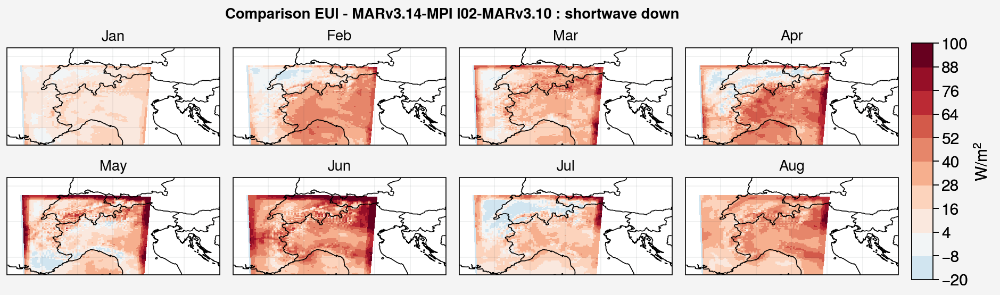

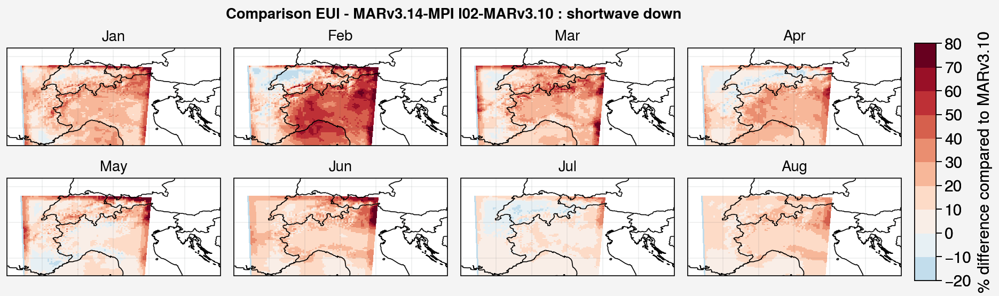

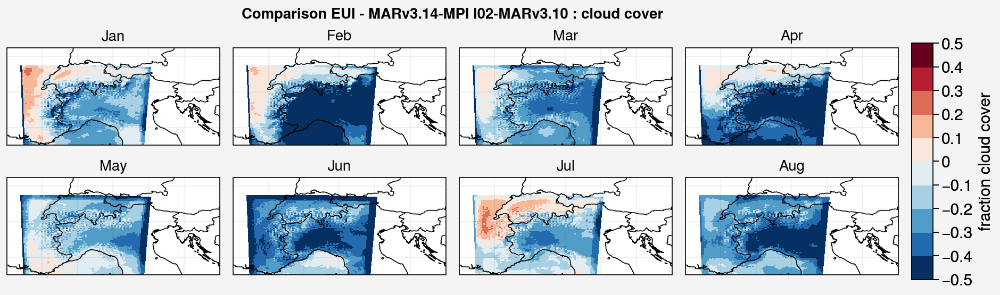

In [83]:
var = "SWD"
plot_comparison(var= "SWD",list_ds = [ds_EUl022015_01_ave[var] - ds_EUy2015_regrid_month[var][0], ds_EUl022015_02_ave[var] - ds_EUy2015_regrid_month[var][1],
                                      ds_EUl022015_03_ave[var] - ds_EUy2015_regrid_month[var][2], ds_EUl022015_04_ave[var] - ds_EUy2015_regrid_month[var][3],
                                      ds_EUl022015_05_ave[var] - ds_EUy2015_regrid_month[var][4], ds_EUl022015_06_ave[var] - ds_EUy2015_regrid_month[var][5],
                                      ds_EUl022015_07_ave[var] - ds_EUy2015_regrid_month[var][6], ds_EUl022015_08_ave[var] - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -20,max = 100,colormap = 'RdBu_r',label_var = 'W/$m^2$',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-MARv3.10 : shortwave down')

var = "SWD"
plot_comparison(var= "SWD",list_ds = [100*(ds_EUl022015_01_ave[var] - ds_EUy2015_regrid_month[var][0])/ds_EUy2015_regrid_month[var][0],
                                      100*(ds_EUl022015_02_ave[var] - ds_EUy2015_regrid_month[var][1])/ds_EUy2015_regrid_month[var][1],
                                      100*(ds_EUl022015_03_ave[var] - ds_EUy2015_regrid_month[var][2])/ds_EUy2015_regrid_month[var][2],
                                      100*(ds_EUl022015_04_ave[var] - ds_EUy2015_regrid_month[var][3])/ds_EUy2015_regrid_month[var][3],
                                      100*(ds_EUl022015_05_ave[var] - ds_EUy2015_regrid_month[var][4])/ds_EUy2015_regrid_month[var][4],
                                      100*(ds_EUl022015_06_ave[var] - ds_EUy2015_regrid_month[var][5])/ds_EUy2015_regrid_month[var][5],
                                      100*(ds_EUl022015_07_ave[var] - ds_EUy2015_regrid_month[var][6])/ds_EUy2015_regrid_month[var][6],
                                      100*(ds_EUl022015_08_ave[var] - ds_EUy2015_regrid_month[var][7])/ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -20,max = 80,colormap = 'RdBu_r',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-MARv3.10 : shortwave down')

var = "CC"
plot_comparison(var= "CC",list_ds = [ds_EUl022015_01_ave[var] - ds_EUy2015_regrid_month[var][0], ds_EUl022015_02_ave[var] - ds_EUy2015_regrid_month[var][1],
                                      ds_EUl022015_03_ave[var] - ds_EUy2015_regrid_month[var][2], ds_EUl022015_04_ave[var] - ds_EUy2015_regrid_month[var][3],
                                      ds_EUl022015_05_ave[var] - ds_EUy2015_regrid_month[var][4], ds_EUl022015_06_ave[var] - ds_EUy2015_regrid_month[var][5],
                                      ds_EUl022015_07_ave[var] - ds_EUy2015_regrid_month[var][6], ds_EUl022015_08_ave[var] - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -0.5,max = 0.5,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l02-MARv3.10 : cloud cover')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

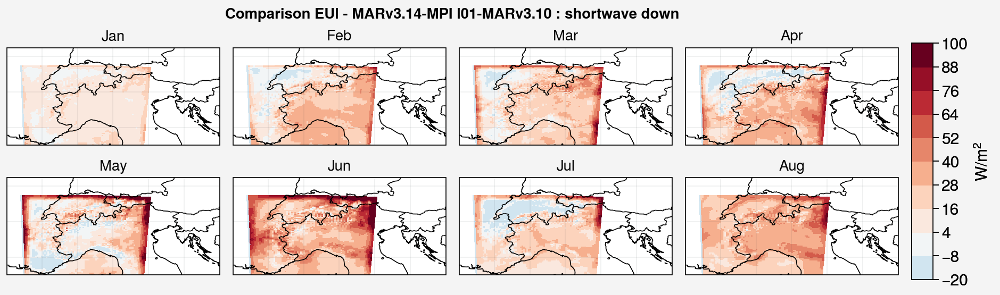

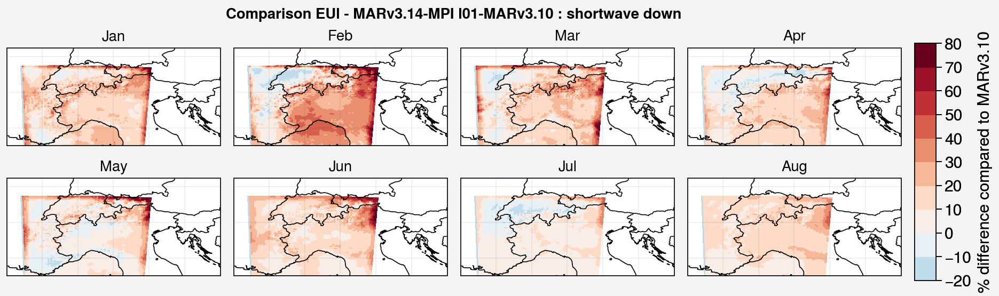

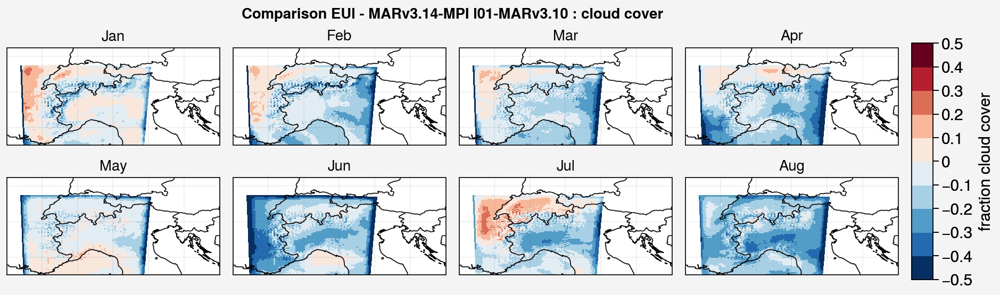

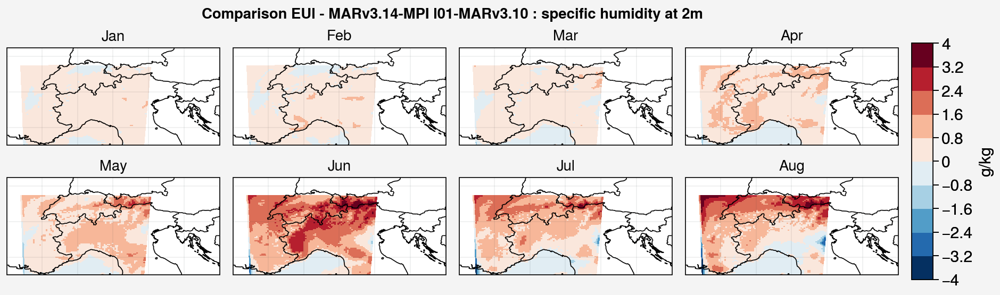

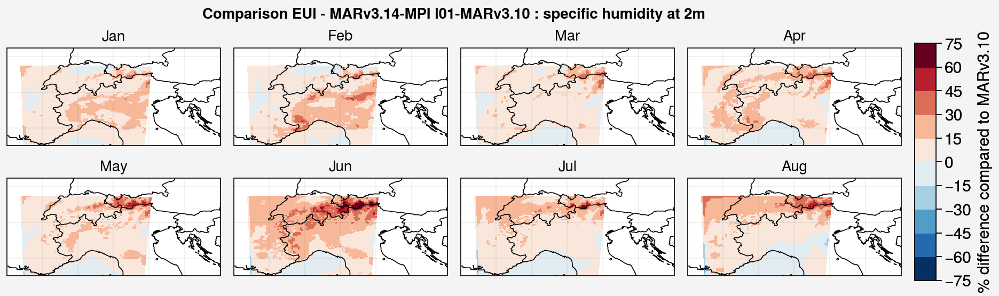

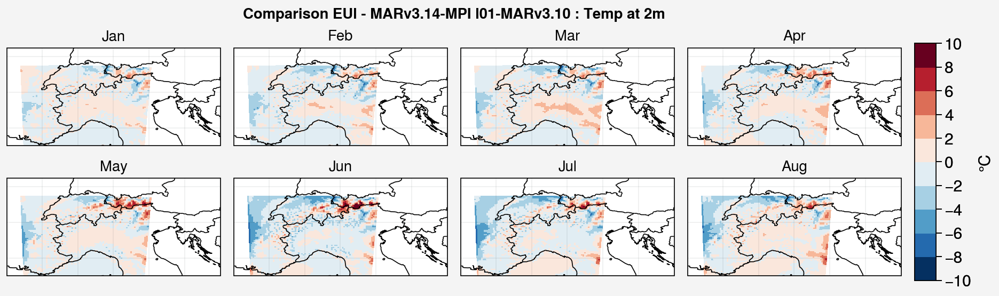

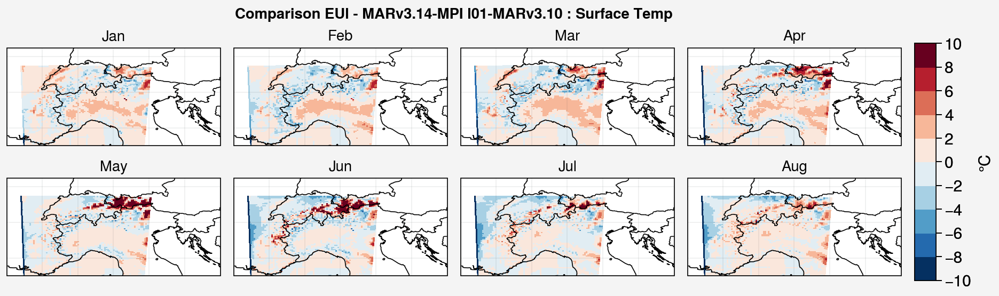

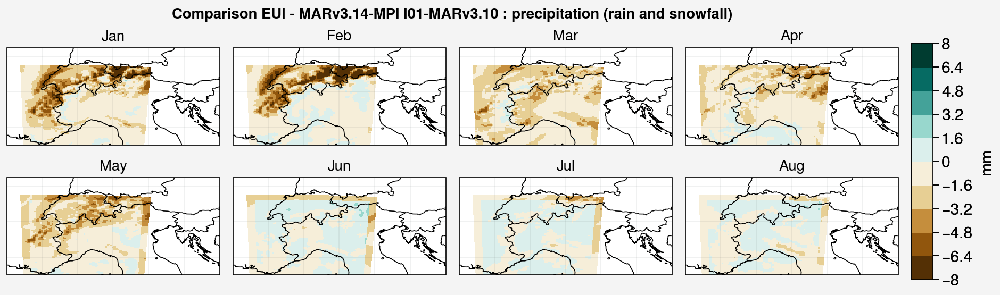

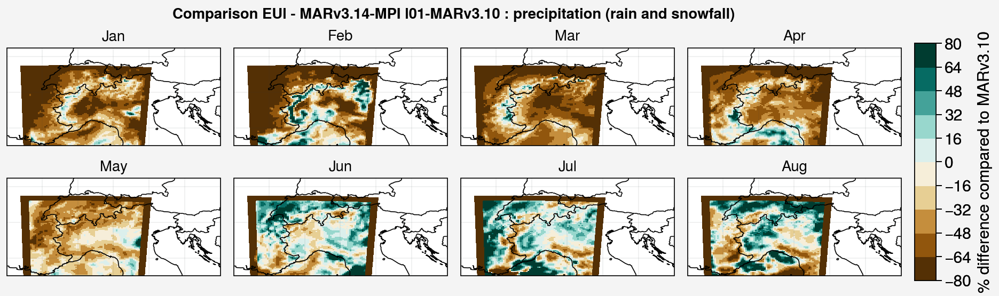

In [18]:
var = "SWD"
plot_comparison(var= "SWD",list_ds = [ds_EUl012015_01_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][0],
                                      ds_EUl012015_02_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][1],
                                      ds_EUl012015_03_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][2],
                                      ds_EUl012015_04_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][3],
                                      ds_EUl012015_05_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][4],
                                      ds_EUl012015_06_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][5],
                                      ds_EUl012015_07_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][6],
                                      ds_EUl012015_08_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -20,max = 100,colormap = 'RdBu_r',label_var = 'W/$m^2$',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : shortwave down')

var = "SWD"
plot_comparison(var= "SWD",list_ds = [100*(ds_EUl012015_01_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][0])/ds_EUy2015_regrid_month[var][0],
                                      100*(ds_EUl012015_02_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][1])/ds_EUy2015_regrid_month[var][1],
                                      100*(ds_EUl012015_03_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][2])/ds_EUy2015_regrid_month[var][2],
                                      100*(ds_EUl012015_04_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][3])/ds_EUy2015_regrid_month[var][3],
                                      100*(ds_EUl012015_05_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][4])/ds_EUy2015_regrid_month[var][4],
                                      100*(ds_EUl012015_06_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][5])/ds_EUy2015_regrid_month[var][5],
                                      100*(ds_EUl012015_07_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][6])/ds_EUy2015_regrid_month[var][6],
                                      100*(ds_EUl012015_08_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][7])/ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -20,max = 80,colormap = 'RdBu_r',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : shortwave down')

var = "CC"
plot_comparison(var= "CC",list_ds = [ds_EUl012015_01_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][0],
                                     ds_EUl012015_02_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][1],
                                     ds_EUl012015_03_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][2],
                                     ds_EUl012015_04_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][3],
                                     ds_EUl012015_05_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][4],
                                     ds_EUl012015_06_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][5],
                                     ds_EUl012015_07_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][6],
                                     ds_EUl012015_08_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -0.5,max = 0.5,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : cloud cover')

var = "QQz"
plot_comparison(var= "QQz",list_ds = [ds_EUl012015_01_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[0],
                                      ds_EUl012015_02_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[1],
                                      ds_EUl012015_03_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[2],
                                      ds_EUl012015_04_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[3],
                                      ds_EUl012015_05_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[4],
                                      ds_EUl012015_06_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[5],
                                      ds_EUl012015_07_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[6],
                                      ds_EUl012015_08_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -4.,max = 4.,colormap = 'RdBu_r',label_var = 'g/kg',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : specific humidity at 2m')

var = "QQz"
plot_comparison(var= "QQz",list_ds = [100*(ds_EUl012015_01_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][0,0])/ds_EUy2015_regrid_month[var][0,0],
                                      100*(ds_EUl012015_02_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][1,0])/ds_EUy2015_regrid_month[var][1,0],
                                      100*(ds_EUl012015_03_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][2,0])/ds_EUy2015_regrid_month[var][2,0],
                                      100*(ds_EUl012015_04_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][3,0])/ds_EUy2015_regrid_month[var][3,0],
                                      100*(ds_EUl012015_05_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][4,0])/ds_EUy2015_regrid_month[var][4,0],
                                      100*(ds_EUl012015_06_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][5,0])/ds_EUy2015_regrid_month[var][5,0],
                                      100*(ds_EUl012015_07_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][6,0])/ds_EUy2015_regrid_month[var][6,0],
                                      100*(ds_EUl012015_08_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][7,0])/ds_EUy2015_regrid_month[var][7,0]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -75,max = 75,colormap = 'RdBu_r',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : specific humidity at 2m')

var = "TTz"
plot_comparison(var= "TTz",list_ds = [ds_EUl012015_01_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[0],
                                      ds_EUl012015_02_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[1],
                                      ds_EUl012015_03_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[2],
                                      ds_EUl012015_04_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[3],
                                      ds_EUl012015_05_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[4],
                                      ds_EUl012015_06_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[5],
                                      ds_EUl012015_07_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[6],
                                      ds_EUl012015_08_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -10,max = 10,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : Temp at 2m')

var = "ST"
plot_comparison(var= "ST",list_ds = [ds_EUl012015_01_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][0],
                                     ds_EUl012015_02_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][1],
                                     ds_EUl012015_03_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][2],
                                     ds_EUl012015_04_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][3],
                                     ds_EUl012015_05_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][4],
                                     ds_EUl012015_06_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][5],
                                     ds_EUl012015_07_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][6],
                                     ds_EUl012015_08_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -10,max = 10,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : Surface Temp')

var = "precip"
list_ds1 = [ds_EUl012015_01_ave[var].groupby('time.day').sum(),ds_EUl012015_02_ave[var].groupby('time.day').sum(),ds_EUl012015_03_ave[var].groupby('time.day').sum(),
            ds_EUl012015_04_ave[var].groupby('time.day').sum(),ds_EUl012015_05_ave[var].groupby('time.day').sum(),ds_EUl012015_06_ave[var].groupby('time.day').sum(),
            ds_EUl012015_07_ave[var].groupby('time.day').sum(),ds_EUl012015_08_ave[var].groupby('time.day').sum()]
plot_comparison(var= "precip",list_ds = [list_ds1[0].mean(axis=0) - ds_EUy2015_regrid_month[var][0], list_ds1[1].mean(axis=0) - ds_EUy2015_regrid_month[var][1],
                                         list_ds1[2].mean(axis=0) - ds_EUy2015_regrid_month[var][2], list_ds1[3].mean(axis=0) - ds_EUy2015_regrid_month[var][3],
                                         list_ds1[4].mean(axis=0) - ds_EUy2015_regrid_month[var][4], list_ds1[5].mean(axis=0) - ds_EUy2015_regrid_month[var][5],
                                         list_ds1[6].mean(axis=0) - ds_EUy2015_regrid_month[var][6], list_ds1[7].mean(axis=0) - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -8,max = 8,colormap = 'BrBG',label_var = 'mm',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : precipitation (rain and snowfall)')

var = "precip"
plot_comparison(var= "precip",list_ds = [100*(list_ds1[0].mean(axis=0) - ds_EUy2015_regrid_month[var][0])/ds_EUy2015_regrid_month[var][0],
                                         100*(list_ds1[1].mean(axis=0) - ds_EUy2015_regrid_month[var][1])/ds_EUy2015_regrid_month[var][1],
                                         100*(list_ds1[2].mean(axis=0) - ds_EUy2015_regrid_month[var][2])/ds_EUy2015_regrid_month[var][2],
                                         100*(list_ds1[3].mean(axis=0) - ds_EUy2015_regrid_month[var][3])/ds_EUy2015_regrid_month[var][3],
                                         100*(list_ds1[4].mean(axis=0) - ds_EUy2015_regrid_month[var][4])/ds_EUy2015_regrid_month[var][4],
                                         100*(list_ds1[5].mean(axis=0) - ds_EUy2015_regrid_month[var][5])/ds_EUy2015_regrid_month[var][5],
                                         100*(list_ds1[6].mean(axis=0) - ds_EUy2015_regrid_month[var][6])/ds_EUy2015_regrid_month[var][6],
                                         100*(list_ds1[7].mean(axis=0) - ds_EUy2015_regrid_month[var][7])/ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -80,max = 80,colormap = 'BrBG',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : precipitation (rain and snowfall)')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

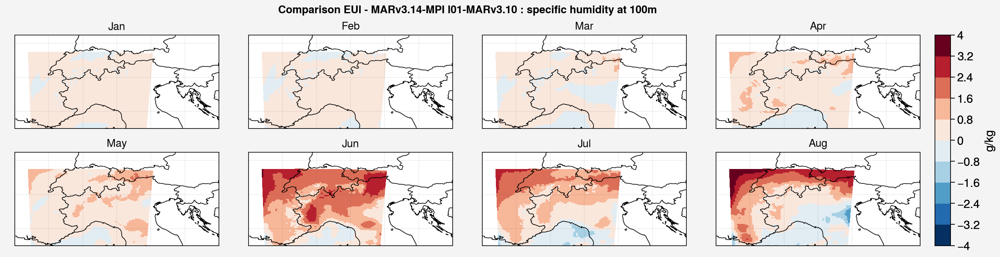

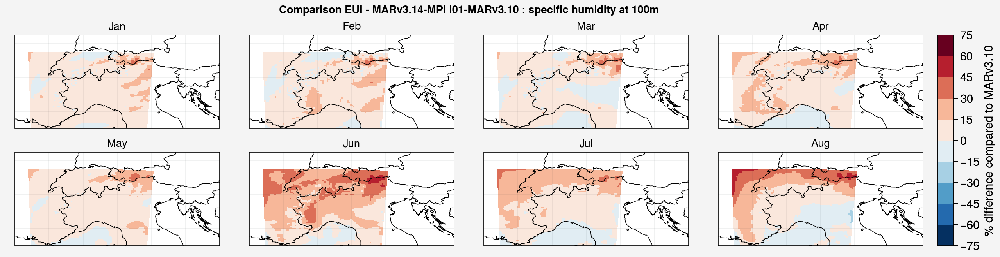

In [39]:
var = "QQz"
plot_comparison(var= "QQz",list_ds = [ds_EUl012015_01_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[0],
                                      ds_EUl012015_02_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[1],
                                      ds_EUl012015_03_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[2],
                                      ds_EUl012015_04_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[3],
                                      ds_EUl012015_05_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[4],
                                      ds_EUl012015_06_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[5],
                                      ds_EUl012015_07_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[6],
                                      ds_EUl012015_08_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var].isel(ztqlev=3)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -4.,max = 4.,colormap = 'RdBu_r',label_var = 'g/kg',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : specific humidity at 100m')

var = "QQz"
plot_comparison(var= "QQz",list_ds = [100*(ds_EUl012015_01_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][0,3])/ds_EUy2015_regrid_month[var][0,3],
                                      100*(ds_EUl012015_02_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][1,3])/ds_EUy2015_regrid_month[var][1,3],
                                      100*(ds_EUl012015_03_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][2,3])/ds_EUy2015_regrid_month[var][2,3],
                                      100*(ds_EUl012015_04_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][3,3])/ds_EUy2015_regrid_month[var][3,3],
                                      100*(ds_EUl012015_05_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][4,3])/ds_EUy2015_regrid_month[var][4,3],
                                      100*(ds_EUl012015_06_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][5,3])/ds_EUy2015_regrid_month[var][5,3],
                                      100*(ds_EUl012015_07_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][6,3])/ds_EUy2015_regrid_month[var][6,3],
                                      100*(ds_EUl012015_08_ave[var].sel(ztqlev='100.0') - ds_EUy2015_regrid_month[var][7,3])/ds_EUy2015_regrid_month[var][7,3]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -75,max = 75,colormap = 'RdBu_r',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : specific humidity at 100m')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

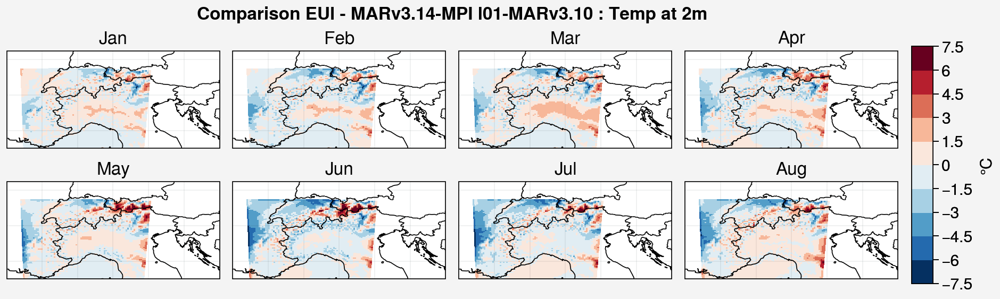

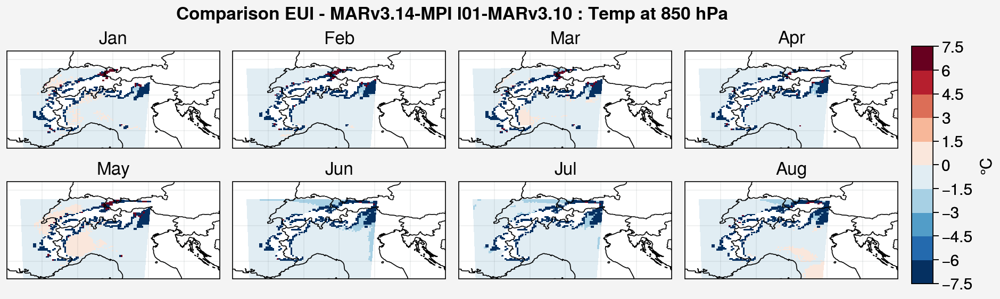

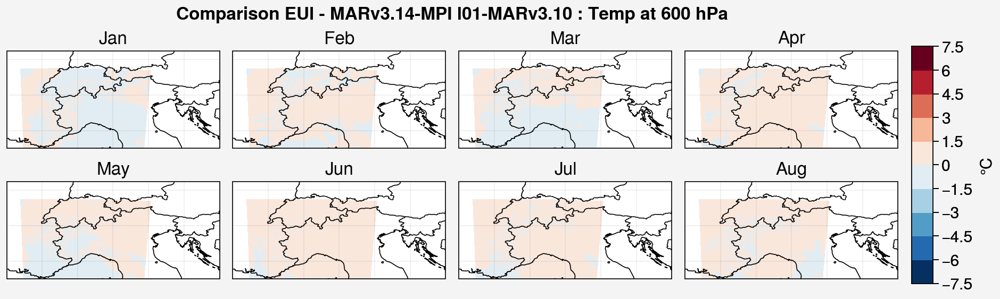

In [42]:
var = "TTz"
plot_comparison(var= "TTz",list_ds = [ds_EUl012015_01_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[0],
                                      ds_EUl012015_02_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[1],
                                      ds_EUl012015_03_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[2],
                                      ds_EUl012015_04_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[3],
                                      ds_EUl012015_05_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[4],
                                      ds_EUl012015_06_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[5],
                                      ds_EUl012015_07_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[6],
                                      ds_EUl012015_08_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -7.5,max = 7.5,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : Temp at 2m')

var = "TTp"
press = "850.0"
plot_comparison(var= "TTp",list_ds = [ds_EUl012015_01_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[0],
                                      ds_EUl012015_02_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[1],
                                      ds_EUl012015_03_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[2],
                                      ds_EUl012015_04_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[3],
                                      ds_EUl012015_05_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[4],
                                      ds_EUl012015_06_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[5],
                                      ds_EUl012015_07_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[6],
                                      ds_EUl012015_08_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -7.5,max = 7.5,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : Temp at 850 hPa')

var = "TTp"
press = "600.0"
plot_comparison(var= "TTp",list_ds = [ds_EUl012015_01_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[0],
                                      ds_EUl012015_02_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[1],
                                      ds_EUl012015_03_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[2],
                                      ds_EUl012015_04_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[3],
                                      ds_EUl012015_05_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[4],
                                      ds_EUl012015_06_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[5],
                                      ds_EUl012015_07_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[6],
                                      ds_EUl012015_08_ave[var].sel(plev=press).mean(axis=0) - ds_EUy2015_regrid_month[var].sel(plev=press)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -7.5,max = 7.5,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : Temp at 600 hPa')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home

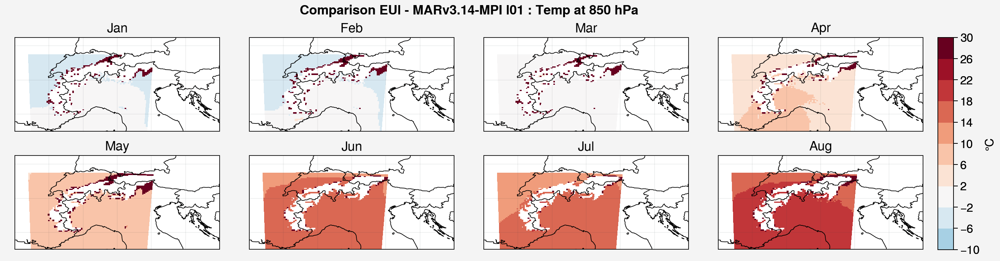

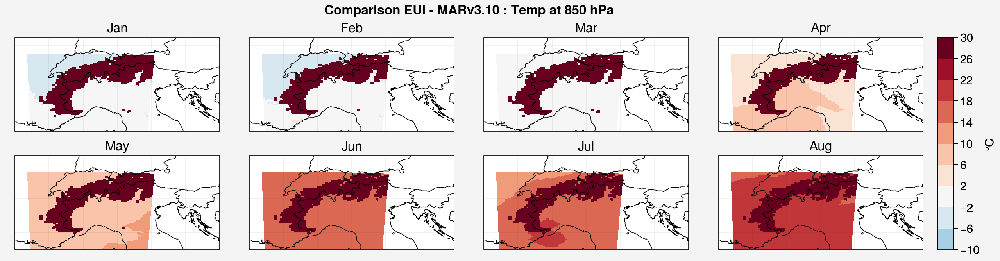

In [38]:
var = "TTp"
press = "850.0"
plot_comparison(var= "TTp",list_ds = [ds_EUl012015_01_ave[var].sel(plev=press).mean(axis=0),
                                      ds_EUl012015_02_ave[var].sel(plev=press).mean(axis=0),
                                      ds_EUl012015_03_ave[var].sel(plev=press).mean(axis=0),
                                      ds_EUl012015_04_ave[var].sel(plev=press).mean(axis=0),
                                      ds_EUl012015_05_ave[var].sel(plev=press).mean(axis=0),
                                      ds_EUl012015_06_ave[var].sel(plev=press).mean(axis=0),
                                      ds_EUl012015_07_ave[var].sel(plev=press).mean(axis=0),
                                      ds_EUl012015_08_ave[var].sel(plev=press).mean(axis=0)],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -10,max = 30,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01 : Temp at 850 hPa')

var = "TTp"
press = "850.0"
plot_comparison(var= "TTp",list_ds = [ds_EUy2015_regrid_month[var].sel(plev=press)[0],
                                      ds_EUy2015_regrid_month[var].sel(plev=press)[1],
                                      ds_EUy2015_regrid_month[var].sel(plev=press)[2],
                                      ds_EUy2015_regrid_month[var].sel(plev=press)[3],
                                      ds_EUy2015_regrid_month[var].sel(plev=press)[4],
                                      ds_EUy2015_regrid_month[var].sel(plev=press)[5],
                                      ds_EUy2015_regrid_month[var].sel(plev=press)[6],
                                      ds_EUy2015_regrid_month[var].sel(plev=press)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -10,max = 30,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.10 : Temp at 850 hPa')

#### Surface balance

In [13]:
ds_month_2015_EUl01 = xr.concat([ds_EUl012015_01_ave.mean(dim='time'),ds_EUl012015_02_ave.mean(dim='time'),ds_EUl012015_03_ave.mean(dim='time'),
                           ds_EUl012015_04_ave.mean(dim='time'),ds_EUl012015_05_ave.mean(dim='time'),ds_EUl012015_06_ave.mean(dim='time'),
                           ds_EUl012015_07_ave.mean(dim='time'),ds_EUl012015_08_ave.mean(dim='time'),ds_EUl012015_09_ave.mean(dim='time'),
                           ds_EUl012015_10_ave.mean(dim='time'),ds_EUl012015_11_ave.mean(dim='time'),ds_EUl012015_12_ave.mean(dim='time')],
                          dim='month')
ds_month_2015_EUl01

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home

<xarray.Dataset>
Dimensions:     (month: 12, y: 79, x: 79, sector: 3, ztqlev: 3, plev: 5)
Coordinates:
  * x           (x) float32 -168.0 -161.0 -154.0 -147.0 ... 364.0 371.0 378.0
  * y           (y) float32 -273.0 -266.0 -259.0 -252.0 ... 259.0 266.0 273.0
  * sector      (sector) float32 1.0 2.0 3.0
  * plev        (plev) float32 850.0 700.0 600.0 500.0 200.0
  * ztqlev      (ztqlev) float32 2.0 10.0 100.0
Dimensions without coordinates: month
Data variables: (12/27)
    SWU         (month, y, x) float32 0.0 10.51 10.51 ... 13.12 12.74 13.69
    SWD         (month, y, x) float32 0.0 105.1 105.1 ... 69.79 70.02 70.82
    LWU         (month, y, x) float32 0.0 0.0 0.0 0.0 ... 271.0 272.6 270.6
    LWD         (month, y, x) float32 0.0 266.0 265.8 ... 201.3 204.2 199.6
    SHF         (month, y, x) float32 0.0 0.0 0.0 0.0 ... -2.55 -3.721 -4.117
    LHF         (month, y, x) float32 0.0 0.0 0.0 0.0 ... 10.19 8.744 12.36
    ...          ...
    MBave       (month, y, x) float32 0.0 0.0 0.0 0.0 ... 0.0 3.768 0.06705
    NSW         (month, y, x) float32 0.0 94.61 94.62 ... 56.67 57.28 57.13
    NLW         (month, y, x) float32 0.0 266.0 265.8 ... -69.69 -68.38 -71.0
    TT2         (month, y, x) float32 10.7 10.66 10.62 ... -6.524 -6.509 -6.499
    precip      (month, y, x) float32 0.0 0.0 0.0 ... 0.002615 0.002187 0.001372
    Surf_Bal    (month, y, x) float32 0.0 360.6 360.4 ... 0.04165 -0.02754

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/tmp/ipykernel_238181/884541276.py:20: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=10, large=12)
/tmp/ipykernel_238181/884541276.py:20: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=10, large=12)


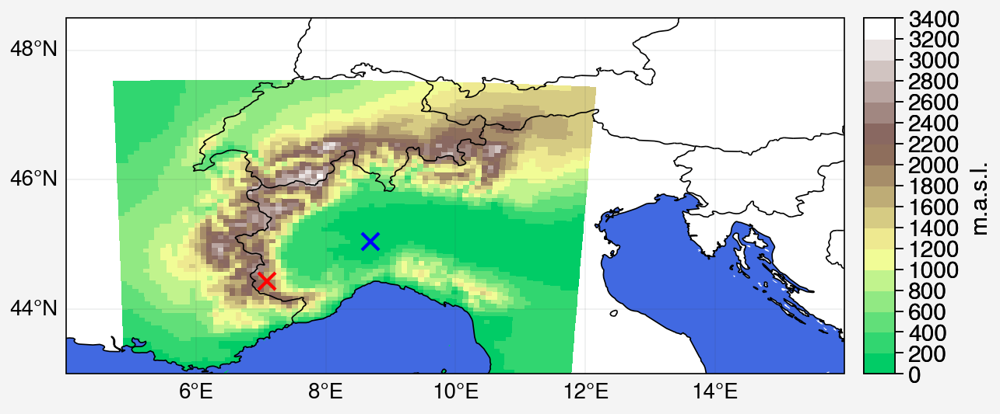

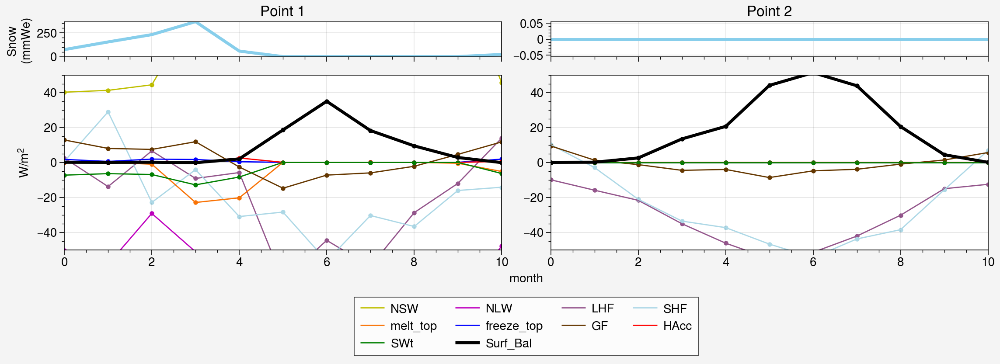

In [21]:

plot_monthly_2points(ds_var = ds_month_2015_EUl01, first=0, last=-1, iloc1 = 30, jloc1 = 25, iloc2 = 40, jloc2 = 43, ymin = -50, ymax = 50,
               names_var = ['NSW','NLW','LHF','SHF','melt_top','freeze_top','GF','HAcc','SWt','Surf_Bal'],
               colors = ['y','m','purple','lightblue','orange','blue','brown','r','green','k'])

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/tmp/ipykernel_238181/884541276.py:20: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=10, large=12)
/tmp/ipykernel_238181/884541276.py:20: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=10, large=12)


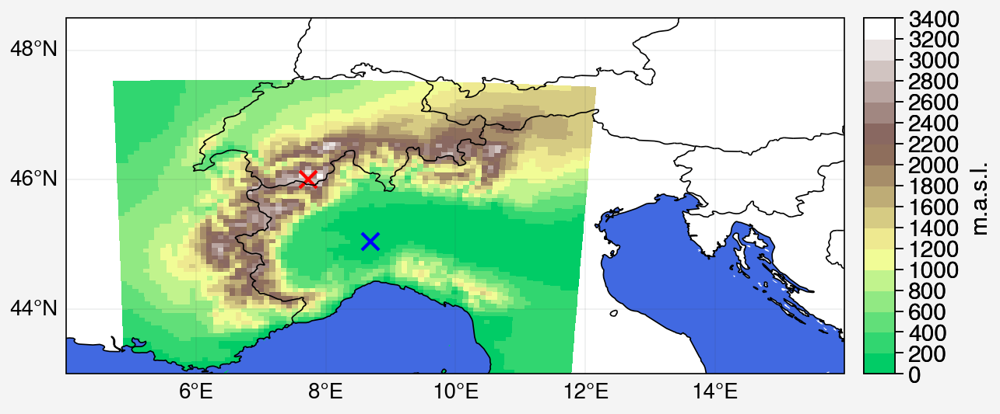

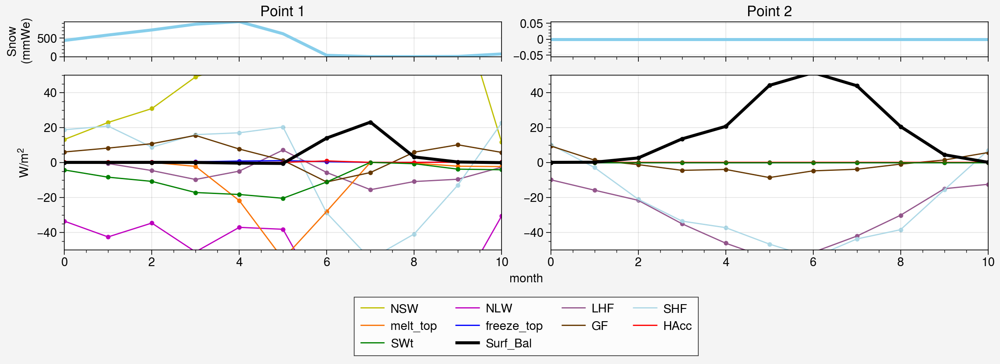

In [23]:

plot_monthly_2points(ds_var = ds_month_2015_EUl01, first=0, last=-1, iloc1 = 55, jloc1 = 32, iloc2 = 40, jloc2 = 43, ymin = -50, ymax = 50,
               names_var = ['NSW','NLW','LHF','SHF','melt_top','freeze_top','GF','HAcc','SWt','Surf_Bal'],
               colors = ['y','m','purple','lightblue','orange','blue','brown','r','green','k'])

In [25]:
ds_month_2015_EUl01.Surf_Bal[:,55,32]

<xarray.DataArray 'Surf_Bal' (month: 12)>
array([-2.6086781e-02, -2.1141818e-02, -4.2598941e-03, -4.2691123e-02,
       -4.2801863e-01, -6.1143434e-01,  1.3895563e+01,  2.3008303e+01,
        3.0804181e+00,  2.1085310e-01, -1.6141790e-01, -2.1582905e-02],
      dtype=float32)
Coordinates:
    x        float32 56.0
    y        float32 112.0
Dimensions without coordinates: month

In [47]:
plot_by_mosaic2(ds_var = ds_EUh2015_k, ds_var_ave = ds_EUh2015_ave, first=0, last=30, iloc = i2, jloc = j2, ymin = -400, ymax = 700,
               names_var = ['NSW','NLW','LHF','SHF','melt_top','freeze_top','GF','HAcc','SWt','Surf_Bal'],
               colors = ['y','m','purple','lightblue','orange','blue','brown','r','green','k'])

<xarray.Dataset>
Dimensions:  (time: 186, y: 79, x: 79, sector: 3, ztqlev: 3)
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01T02:00:00 ... 2015-01-31T22:00:00
  * x        (x) float32 -168.0 -161.0 -154.0 -147.0 ... 357.0 364.0 371.0 378.0
  * y        (y) float32 -273.0 -266.0 -259.0 -252.0 ... 252.0 259.0 266.0 273.0
  * sector   (sector) float32 1.0 2.0 3.0
  * ztqlev   (ztqlev) float32 2.0 10.0 100.0
Data variables: (12/21)
    SWU      (time, y, x) float32 ...
    SWD      (time, y, x) float32 ...
    LWU      (time, y, x) float32 ...
    LWD      (time, y, x) float32 ...
    SHF      (time, y, x) float32 ...
    LHF      (time, y, x) float32 ...
    ...       ...
    ST       (time, y, x) float32 ...
    MBave    (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 12.89 11.45 9.258 0.0
    NSW      (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    NLW      (time, y, x) float32 0.0 273.9 273.7 273.4 ... -51.75 -63.81 -68.29
    TT2      (time, y, x) float32 ...
    precip   (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        ICE - Exp: l01 - 20150101
    institution:  ULg (Xavier Fettweis)
    history:      libUN (2005.04.08) - Tue Jun 24 14:36:56 2025
    netcdf:       4.8.0 of May  2 2023 12:43:48 $

/tmp/ipykernel_3070058/18526757.py:11: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=10, large=12)
/tmp/ipykernel_3070058/18526757.py:11: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=10, large=12)


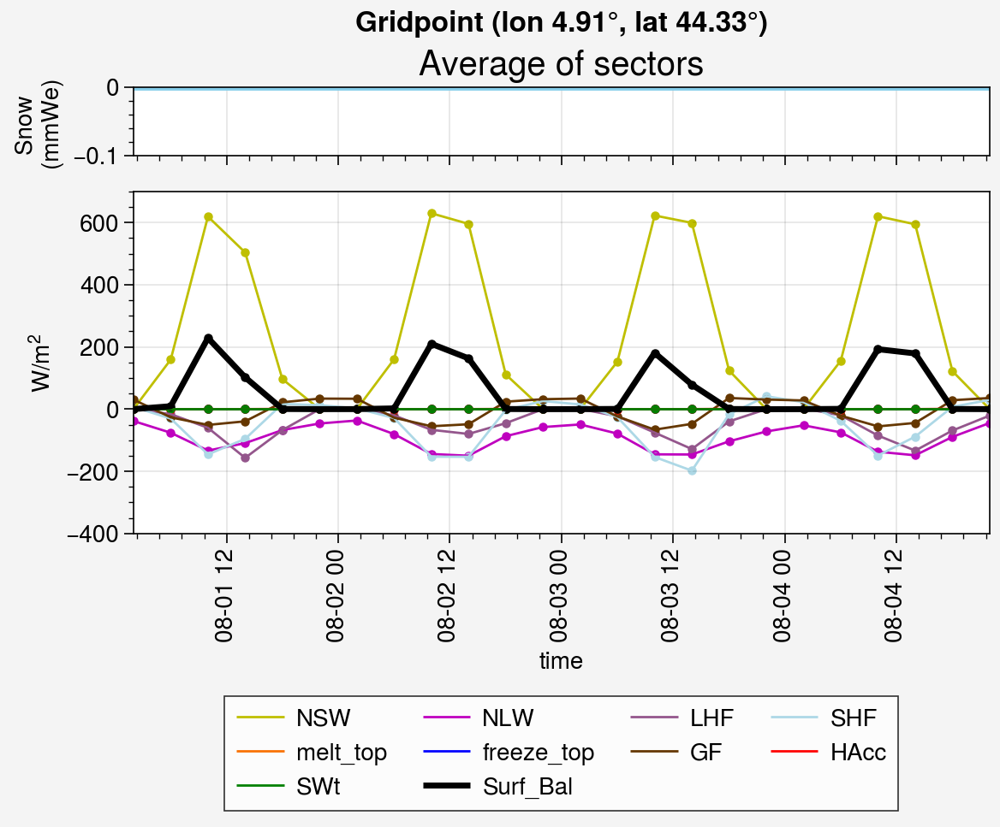

In [23]:
ds_var_ave = ds_EUl012015_08_ave
names_var = ['NSW','NLW','LHF','SHF','melt_top','freeze_top','GF','HAcc','SWt','Surf_Bal']
colors = ['y','m','purple','lightblue','orange','blue','brown','r','green','k']
iloc, jloc, ymin, ymax = 40, 43, -400, 700
first = 0
last = 24

longitude_point = round(float(ds.LON[iloc,jloc]),2)
latitude_point = round(float(ds.LAT[iloc,jloc]),2)
f, axs = pplt.subplots(axwidth=5,axheight=0.4,ncols=1,nrows=2,hratios=(1,5),ref=1,sharey=False)
pplt.rc.update(small=10, large=12)

for i,var in enumerate(names_var):
    if(var=='Surf_Bal' or var=='Surf_Bal_HA_col' or var=='Surf_Bal_nofreeze' or var=='Surf_Bal_noHAcc'):
        line_width=2.5
    else:
        line_width=1
    ax=axs[1]
    ax.set_ylim([ymin,ymax])
    ax.format(ylabel='W/$m^2$')
    ax.scatter(ds_var_ave.time[first:last], np.array(ds_var_ave[var])[first:last,iloc,jloc], c=colors[i], s=10)
    ax.plot(ds_var_ave.time[first:last], np.array(ds_var_ave[var])[first:last,iloc,jloc], c=colors[i],linewidth=line_width,label=var)


max_MB = np.array(ds_var_ave['MB'])[first:last,:,iloc,jloc].max()
ax=axs[0]
ax.format(title='Average of sectors',ylabel='Snow \n(mmWe)')
ax.set_ylim([-0.1,max_MB])
ax.plot(ds_var_ave.time[first:last], np.array(ds_var_ave['MBave'])[first:last,iloc,jloc], c='skyblue',linewidth=line_width)

f.format(titlesize='20px',suptitle=f'Gridpoint (lon {longitude_point}°, lat {latitude_point}°)')
f.legend(loc='b',prop = { "size": 10 },ncols=4)

### Aerosol climatology effect on precip : l04 is back to static aerosols

In [10]:
vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","QQz","TTz","ST","TTp"]

ds_EUl042014_09_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='09',days_in_month='30',sim='l04',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl042014_10_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='10',days_in_month='31',sim='l04',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl042014_11_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='11',days_in_month='30',sim='l04',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUl042014_12_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='12',days_in_month='31',sim='l04',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

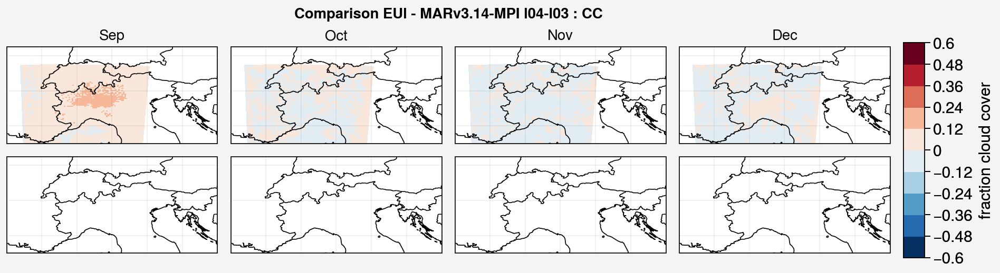

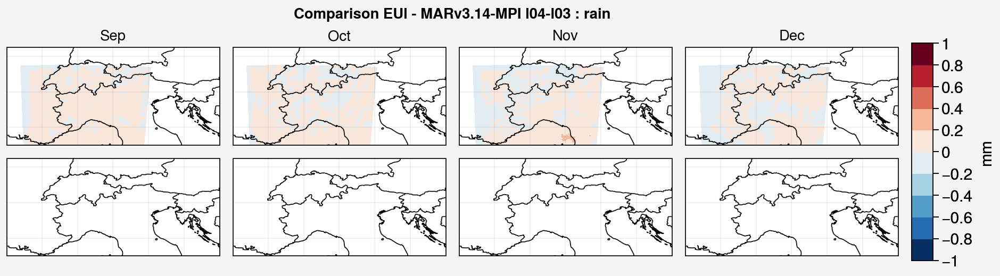

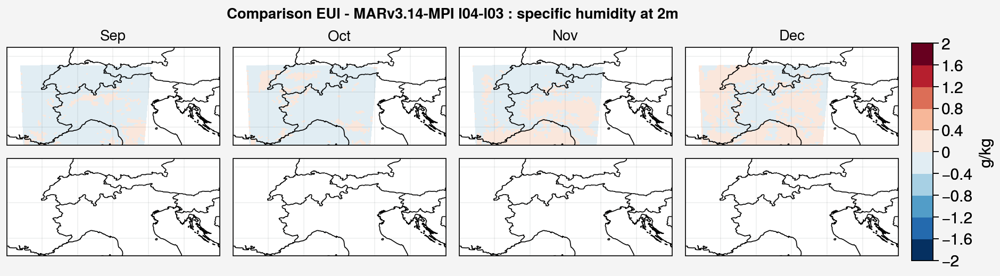

In [14]:
# l04 vs l03

# -------------------------------------------
var = "CC"
plot_comparison(var= "CC",list_ds = [ds_EUl042014_09_ave[var].mean(axis=0) - ds_EUl032014_09_ave[var].mean(axis=0),
                                     ds_EUl042014_10_ave[var].mean(axis=0) - ds_EUl032014_10_ave[var].mean(axis=0),
                                     ds_EUl042014_11_ave[var].mean(axis=0) - ds_EUl032014_11_ave[var].mean(axis=0),
                                     ds_EUl042014_12_ave[var].mean(axis=0) - ds_EUl032014_12_ave[var].mean(axis=0)],
                months = ['Sep','Oct','Nov','Dec'],min = -0.6,max = 0.6,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l04-l03 : CC')

# -------------------------------------------
var = "MBrr"
plot_comparison(var= "MBrr",list_ds = [ds_EUl042014_09_ave[var].mean(axis=0) - ds_EUl032014_09_ave[var].mean(axis=0),
                                       ds_EUl042014_10_ave[var].mean(axis=0) - ds_EUl032014_10_ave[var].mean(axis=0),
                                       ds_EUl042014_11_ave[var].mean(axis=0) - ds_EUl032014_11_ave[var].mean(axis=0),
                                       ds_EUl042014_12_ave[var].mean(axis=0) - ds_EUl032014_12_ave[var].mean(axis=0)],
                months = ['Sep','Oct','Nov','Dec'],min = -1,max = 1,colormap = 'RdBu_r',label_var = 'mm',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l04-l03 : rain')

# -------------------------------------------
var = "QQz"
plot_comparison(var= "QQz",list_ds = [ds_EUl042014_09_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl032014_09_ave[var].isel(ztqlev=0).mean(axis=0),
                                      ds_EUl042014_10_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl032014_10_ave[var].isel(ztqlev=0).mean(axis=0),
                                      ds_EUl042014_11_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl032014_11_ave[var].isel(ztqlev=0).mean(axis=0),
                                      ds_EUl042014_12_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUl032014_12_ave[var].isel(ztqlev=0).mean(axis=0)],
                months = ['Sep','Oct','Nov','Dec'],min = -2,max = 2,colormap = 'RdBu_r',label_var = 'g/kg',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l04-l03 : specific humidity at 2m')

## Smallish domain : 100x90, 10km resolution

In [98]:
vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","QQz","TTz","ST","TTp"]

ds_EUm012014_09_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='09',days_in_month='30',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012014_10_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='10',days_in_month='31',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012014_11_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='11',days_in_month='30',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012014_12_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='12',days_in_month='31',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')

In [34]:
vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","QQz","TTz","ST","TTp"]

ds_EUm012015_01_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='01',days_in_month='31',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012015_02_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='02',days_in_month='28',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012015_03_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='03',days_in_month='31',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012015_04_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='04',days_in_month='30',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012015_05_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='05',days_in_month='31',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012015_06_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='06',days_in_month='30',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012015_07_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='07',days_in_month='31',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')
ds_EUm012015_08_ave = open_monthly_data_ave(vars=vars_list,year='2015',month='08',days_in_month='31',sim='m01',timestep_in_hours = 4,imin = 0, imax = -1,
                                            jmin = 0, jmax = -1, whichpath='castelli')

In [35]:
ds_smallish = xr.open_dataset('/bettik/castelli/MARout/EUm/m01/2014/ICE.m01.2014.09.01-30.nc')[["LON","LAT","SH","FRV","VEG"]]


In [36]:
ds_smallish.coords['lon'] = ds_smallish.LON
ds_smallish.coords['lat'] = ds_smallish.LAT

In [37]:
# Regridding MARv3.10 onto smallish domain

# MAR has a very slight difference in x and y positions of grid cells between MARgrid and the simulations, which will prevent the regridding. So have to do this :
lon_correct_xy = ds.LON # copy the incorrect lon/lat
lat_correct_xy = ds.LAT
#lat_correct_xy = ds.LAT[jmin:jmax,imin:imax]

lon_correct_xy["x"] = ("x", ds_EUy2015.x.values) # correct lon
lon_correct_xy["y"] = ("y", ds_EUy2015.y.values)

lat_correct_xy["x"] = ("x", ds_EUy2015.x.values) # correct lat
lat_correct_xy["y"] = ("y", ds_EUy2015.y.values)

ds_EUy2015.coords['lon'] = lon_correct_xy
ds_EUy2015.coords['lat'] = lat_correct_xy

ds_EUy2015_regrid = u.regrid(ds_EUy2015,ds_smallish,'bilinear',globe=True,periodic=False,reuse_weights=False)

In [38]:
ds_EUy2015_month = ds_EUy2015.groupby("time.month").mean()
ds_EUy2015_regrid_month = ds_EUy2015_regrid.groupby("time.month").mean()

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

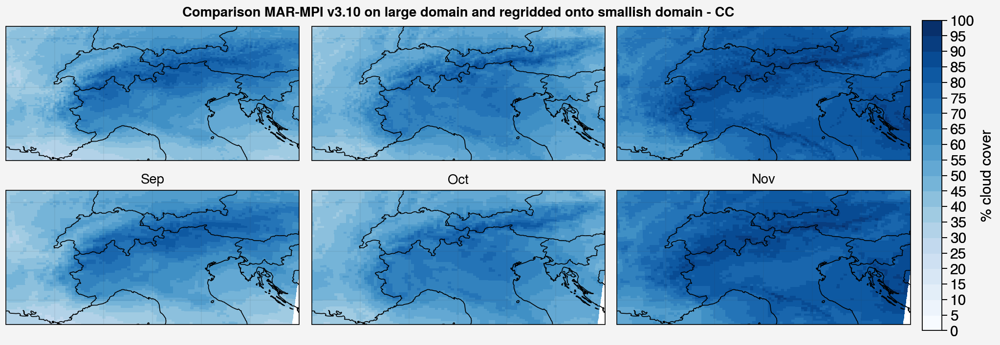

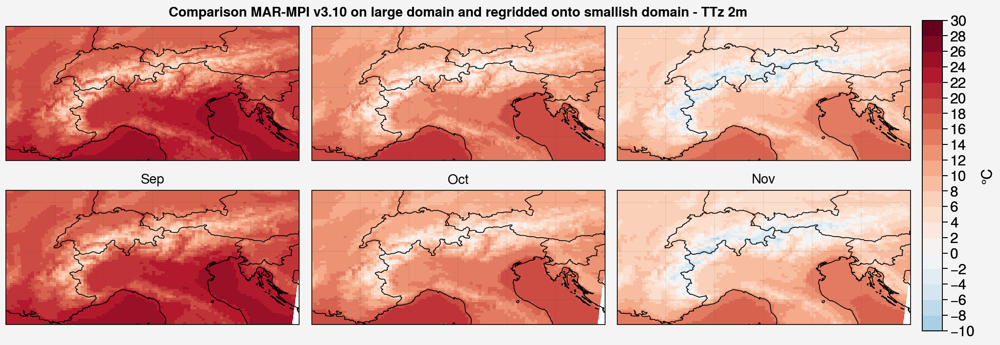

In [17]:
# Test to see if regrid worked well

f, axs = pplt.subplots(proj='cyl',axwidth=3,ncols=3,nrows=2,axheight=1.5)

months = ['Sep','Oct','Nov']


for mon in range(3):
    ax=axs[mon]
    m = ax.pcolormesh(ds.LON,ds.LAT,100*ds_EUy2015_month.CC[mon+8],levels=np.linspace(0,100,21),cmap='Blues')
    
    ax=axs[mon+3]
    m = ax.pcolormesh(ds_smallish.LON,ds_smallish.LAT,100*ds_EUy2015_regrid_month.CC[mon+8],levels=np.linspace(0,100,21),cmap='Blues')
    ax.format(title=months[mon])


f.colorbar(m,label= '% cloud cover',labelsize='large',ticklabelsize='large')
axs.format(**multiplot_format,suptitle='Comparison MAR-MPI v3.10 on large domain and regridded onto smallish domain - CC')

# --------------------------------------------------

f, axs = pplt.subplots(proj='cyl',axwidth=3,ncols=3,nrows=2,axheight=1.5)

for mon in range(3):
    ax=axs[mon]
    m = ax.pcolormesh(ds.LON,ds.LAT,ds_EUy2015_month.TTz.isel(ztqlev=0)[mon+8],levels=np.linspace(-10,30,21),cmap='RdBu_r')
    
    ax=axs[mon+3]
    m = ax.pcolormesh(ds_smallish.LON,ds_smallish.LAT,ds_EUy2015_regrid_month.TTz.isel(ztqlev=0)[mon+8],levels=np.linspace(-10,30,21),cmap='RdBu_r')
    ax.format(title=months[mon])


f.colorbar(m,label= '°C',labelsize='large',ticklabelsize='large')
axs.format(**multiplot_format,suptitle='Comparison MAR-MPI v3.10 on large domain and regridded onto smallish domain - TTz 2m')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

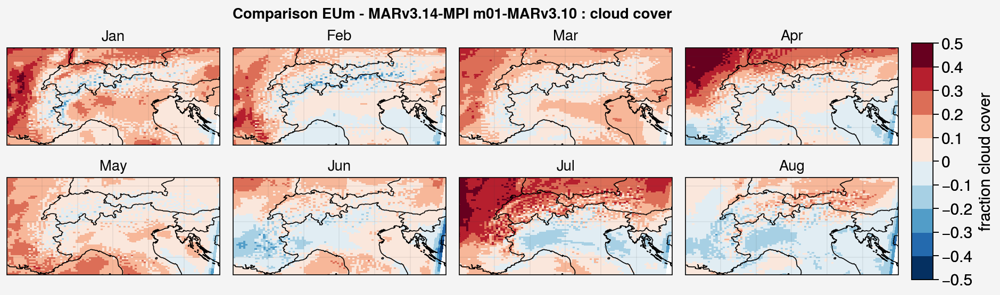

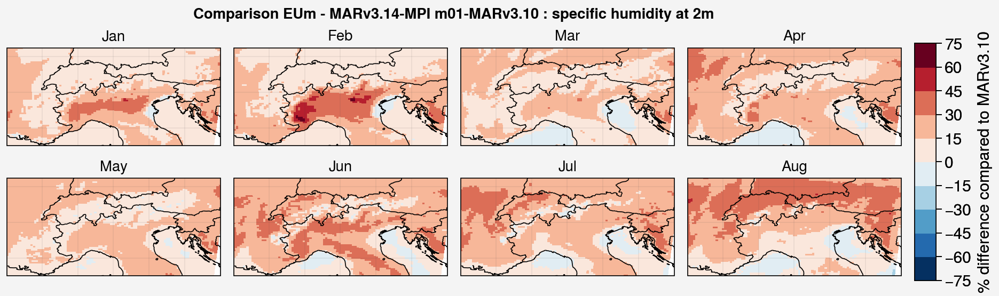

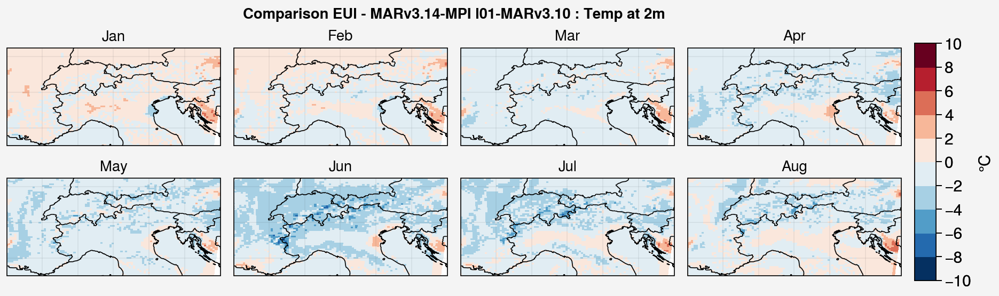

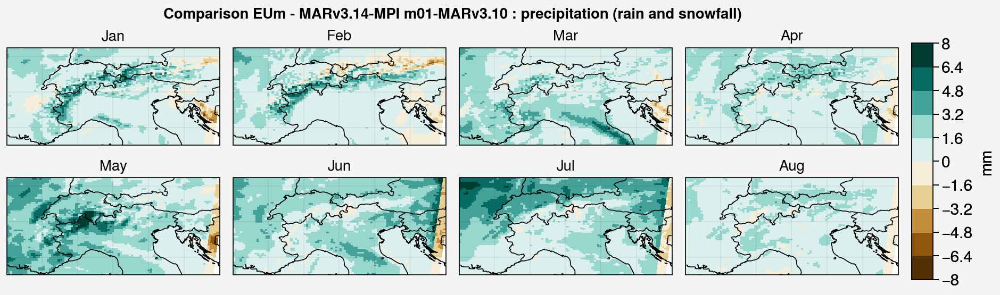

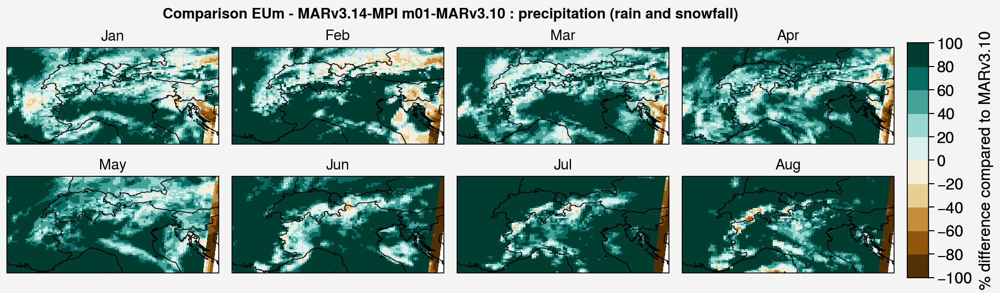

In [42]:
# Compare m01 to v3.10

var = "CC"
plot_comparison(var= "CC",list_ds = [ds_EUm012015_01_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][0],
                                     ds_EUm012015_02_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][1],
                                     ds_EUm012015_03_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][2],
                                     ds_EUm012015_04_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][3],
                                     ds_EUm012015_05_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][4],
                                     ds_EUm012015_06_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][5],
                                     ds_EUm012015_07_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][6],
                                     ds_EUm012015_08_ave[var].mean(axis=0) - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -0.5,max = 0.5,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'Comparison EUm - MARv3.14-MPI m01-MARv3.10 : cloud cover',ds_size=ds_smallish)

var = "QQz"
plot_comparison(var= "QQz",list_ds = [100*(ds_EUm012015_01_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][0,0])/ds_EUy2015_regrid_month[var][0,0],
                                      100*(ds_EUm012015_02_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][1,0])/ds_EUy2015_regrid_month[var][1,0],
                                      100*(ds_EUm012015_03_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][2,0])/ds_EUy2015_regrid_month[var][2,0],
                                      100*(ds_EUm012015_04_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][3,0])/ds_EUy2015_regrid_month[var][3,0],
                                      100*(ds_EUm012015_05_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][4,0])/ds_EUy2015_regrid_month[var][4,0],
                                      100*(ds_EUm012015_06_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][5,0])/ds_EUy2015_regrid_month[var][5,0],
                                      100*(ds_EUm012015_07_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][6,0])/ds_EUy2015_regrid_month[var][6,0],
                                      100*(ds_EUm012015_08_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var][7,0])/ds_EUy2015_regrid_month[var][7,0]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -75,max = 75,colormap = 'RdBu_r',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUm - MARv3.14-MPI m01-MARv3.10 : specific humidity at 2m',ds_size=ds_smallish)

var = "TTz"
plot_comparison(var= "TTz",list_ds = [ds_EUm012015_01_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[0],
                                      ds_EUm012015_02_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[1],
                                      ds_EUm012015_03_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[2],
                                      ds_EUm012015_04_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[3],
                                      ds_EUm012015_05_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[4],
                                      ds_EUm012015_06_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[5],
                                      ds_EUm012015_07_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[6],
                                      ds_EUm012015_08_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2015_regrid_month[var].isel(ztqlev=0)[7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -10,max = 10,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUl - MARv3.14-MPI l01-MARv3.10 : Temp at 2m',ds_size=ds_smallish)

var = "precip"
list_ds1 = [ds_EUm012015_01_ave[var].groupby('time.day').sum(),ds_EUm012015_02_ave[var].groupby('time.day').sum(),ds_EUm012015_03_ave[var].groupby('time.day').sum(),
            ds_EUm012015_04_ave[var].groupby('time.day').sum(),ds_EUm012015_05_ave[var].groupby('time.day').sum(),ds_EUm012015_06_ave[var].groupby('time.day').sum(),
            ds_EUm012015_07_ave[var].groupby('time.day').sum(),ds_EUm012015_08_ave[var].groupby('time.day').sum()]
plot_comparison(var= "precip",list_ds = [list_ds1[0].mean(axis=0) - ds_EUy2015_regrid_month[var][0],
                                         list_ds1[1].mean(axis=0) - ds_EUy2015_regrid_month[var][1],
                                         list_ds1[2].mean(axis=0) - ds_EUy2015_regrid_month[var][2],
                                         list_ds1[3].mean(axis=0) - ds_EUy2015_regrid_month[var][3],
                                         list_ds1[4].mean(axis=0) - ds_EUy2015_regrid_month[var][4],
                                         list_ds1[5].mean(axis=0) - ds_EUy2015_regrid_month[var][5],
                                         list_ds1[6].mean(axis=0) - ds_EUy2015_regrid_month[var][6],
                                         list_ds1[7].mean(axis=0) - ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -8,max = 8,colormap = 'BrBG',label_var = 'mm',
                suptitle_var = 'Comparison EUm - MARv3.14-MPI m01-MARv3.10 : precipitation (rain and snowfall)',ds_size=ds_smallish)

var = "precip"
list_ds1 = [ds_EUm012015_01_ave[var].groupby('time.day').sum(),ds_EUm012015_02_ave[var].groupby('time.day').sum(),ds_EUm012015_03_ave[var].groupby('time.day').sum(),
            ds_EUm012015_04_ave[var].groupby('time.day').sum(),ds_EUm012015_05_ave[var].groupby('time.day').sum(),ds_EUm012015_06_ave[var].groupby('time.day').sum(),
            ds_EUm012015_07_ave[var].groupby('time.day').sum(),ds_EUm012015_08_ave[var].groupby('time.day').sum()]
plot_comparison(var= "precip",list_ds = [100*(list_ds1[0].mean(axis=0) - ds_EUy2015_regrid_month[var][0])/ds_EUy2015_regrid_month[var][0],
                                         100*(list_ds1[1].mean(axis=0) - ds_EUy2015_regrid_month[var][1])/ds_EUy2015_regrid_month[var][1],
                                         100*(list_ds1[2].mean(axis=0) - ds_EUy2015_regrid_month[var][2])/ds_EUy2015_regrid_month[var][2],
                                         100*(list_ds1[3].mean(axis=0) - ds_EUy2015_regrid_month[var][3])/ds_EUy2015_regrid_month[var][3],
                                         100*(list_ds1[4].mean(axis=0) - ds_EUy2015_regrid_month[var][4])/ds_EUy2015_regrid_month[var][4],
                                         100*(list_ds1[5].mean(axis=0) - ds_EUy2015_regrid_month[var][5])/ds_EUy2015_regrid_month[var][5],
                                         100*(list_ds1[6].mean(axis=0) - ds_EUy2015_regrid_month[var][6])/ds_EUy2015_regrid_month[var][6],
                                         100*(list_ds1[7].mean(axis=0) - ds_EUy2015_regrid_month[var][7])/ds_EUy2015_regrid_month[var][7]],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'],min = -100,max = 100,colormap = 'BrBG',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUm - MARv3.14-MPI m01-MARv3.10 : precipitation (rain and snowfall)',ds_size=ds_smallish)

In [22]:
ds_EUy2015_regrid.precip[:,jmin:jmax,imin:imax]

<xarray.DataArray 'precip' (time: 365, y: 55, x: 38)>
array([[[3.84632614e-04, 3.62915103e-04, 6.36613520e-04, ...,
         1.80530315e-03, 9.44769767e-04, 1.41319679e-03],
        [1.35520601e-03, 1.06874970e-03, 3.92961869e-04, ...,
         3.69756459e-03, 1.39995292e-03, 9.84051498e-04],
        [2.69454345e-03, 2.32850946e-03, 9.89388558e-04, ...,
         1.94181898e-03, 2.12998572e-03, 2.55144690e-03],
        ...,
        [1.51441031e+01, 9.74264526e+00, 7.51342154e+00, ...,
         5.91709661e+00, 6.14536572e+00, 5.96601105e+00],
        [1.63932381e+01, 1.04840679e+01, 7.93737841e+00, ...,
         6.25004816e+00, 6.25284910e+00, 6.62989950e+00],
        [1.23985300e+01, 8.90062809e+00, 7.19655943e+00, ...,
         7.53146744e+00, 6.85428524e+00, 6.79412365e+00]],

       [[3.62044526e-03, 3.73865920e-03, 1.86057272e-03, ...,
         1.72487587e-01, 6.70427158e-02, 5.09796739e-02],
        [5.08592976e-03, 3.73966829e-03, 2.62571522e-03, ...,
         2.15678647e-01, 3.50971222e-02, 7.85250682e-03],
        [1.54041955e-02, 7.10574910e-03, 3.47646442e-03, ...,
         6.53535947e-02, 8.00659042e-03, 4.01616003e-03],
...
        [7.43742228e+00, 8.88894272e+00, 8.71635056e+00, ...,
         8.24052375e-04, 4.81502881e-04, 5.36043197e-04],
        [8.04400349e+00, 9.19731331e+00, 1.01775570e+01, ...,
         1.12110400e-03, 1.47365069e-03, 1.02507859e-03],
        [8.20657730e+00, 9.18115139e+00, 1.01870470e+01, ...,
         1.64975412e-03, 9.43880819e-04, 1.00506458e-03]],

       [[1.41400833e+01, 1.39132376e+01, 1.48148746e+01, ...,
         5.37749708e-01, 6.15064979e-01, 1.29051793e+00],
        [1.14251509e+01, 1.27160501e+01, 2.14029293e+01, ...,
         1.21730280e+00, 1.37445879e+00, 1.82901931e+00],
        [1.05647335e+01, 1.06093674e+01, 1.63241119e+01, ...,
         2.19198680e+00, 1.33241522e+00, 1.63607311e+00],
        ...,
        [2.39694327e-01, 1.05017811e-01, 4.67199646e-03, ...,
         3.48461308e-02, 2.56714188e-02, 2.92003080e-02],
        [1.89407662e-01, 6.18084520e-02, 3.01270606e-03, ...,
         5.98718189e-02, 4.16336022e-02, 3.58898267e-02],
        [1.91737786e-01, 3.18099000e-02, 2.40625232e-03, ...,
         3.73432934e-02, 4.47167829e-02, 4.88142967e-02]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01T12:00:00 ... 2015-12-31T12:00:00
  * x        (x) float32 -50.0 -40.0 -30.0 -20.0 ... 290.0 300.0 310.0 320.0
  * y        (y) float32 -240.0 -230.0 -220.0 -210.0 ... 270.0 280.0 290.0 300.0
    lat      (y, x) float32 43.84 43.84 43.84 43.84 ... 48.63 48.62 48.62 48.61
    lon      (y, x) float32 7.377 7.502 7.626 7.751 ... 11.94 12.08 12.21 12.35

In [17]:
ds_EUm012015_01_ave

<xarray.Dataset>
Dimensions:     (time: 186, x: 99, y: 89, sector: 3, plev: 5, ztqlev: 3)
Coordinates:
  * time        (time) datetime64[ns] 2015-01-01T02:00:00 ... 2015-01-31T22:0...
  * x           (x) float32 -370.0 -360.0 -350.0 -340.0 ... 590.0 600.0 610.0
  * y           (y) float32 -440.0 -430.0 -420.0 -410.0 ... 420.0 430.0 440.0
  * sector      (sector) float32 1.0 2.0 3.0
  * plev        (plev) float32 850.0 700.0 600.0 500.0 200.0
  * ztqlev      (ztqlev) float32 2.0 10.0 100.0
Data variables: (12/27)
    SWU         (time, y, x) float32 ...
    SWD         (time, y, x) float32 ...
    LWU         (time, y, x) float32 ...
    LWD         (time, y, x) float32 ...
    SHF         (time, y, x) float32 ...
    LHF         (time, y, x) float32 ...
    ...          ...
    MBave       (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan nan
    NSW         (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    NLW         (time, y, x) float32 0.0 276.6 276.8 ... -25.69 -24.46 -34.05
    TT2         (time, y, x) float32 ...
    precip      (time, y, x) float32 0.0 0.0 0.0 ... 0.005146 0.004578 0.003345
    Surf_Bal    (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan nan
Attributes:
    title:        ICE - Exp: m01 - 20150101
    institution:  ULg (Xavier Fettweis)
    history:      libUN (2005.04.08) - Sat Jun 28 01:56:16 2025
    netcdf:       4.8.0 of May  2 2023 12:43:48 $

### Big domain, MARv3.14 vs MARv3.10

In [11]:
#vars_list = ["SWU","SWD","LWU","LWD","SHF","LHF","MB","MBmTop","MBrTop","GF","HAcc","SWt","MBrr","MBsf","CC","QQz","TTz","ST","TTp"]
vars_list = ["SWU","SWD","MBrr","MBsf","CC","QQz","TTz","ST"]

ds_EUn012014_09_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='09',days_in_month='30',sim='n01',timestep_in_hours = 4,imin = 0, imax = None,
                                            jmin = 0, jmax = None, whichpath='castelli')
ds_EUn012014_10_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='10',days_in_month='31',sim='n01',timestep_in_hours = 4,imin = 0, imax = None,
                                            jmin = 0, jmax = None, whichpath='castelli')
ds_EUn012014_11_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='11',days_in_month='30',sim='n01',timestep_in_hours = 4,imin = 0, imax = None,
                                            jmin = 0, jmax = None, whichpath='castelli')
ds_EUn012014_12_ave = open_monthly_data_ave(vars=vars_list,year='2014',month='12',days_in_month='31',sim='n01',timestep_in_hours = 4,imin = 0, imax = None,
                                            jmin = 0, jmax = None, whichpath='castelli')

In [12]:
ds_EUy2014 = ds_EUy2014.assign_coords(x=ds_EUn012014_09_ave.x)
ds_EUy2014 = ds_EUy2014.assign_coords(y=ds_EUn012014_09_ave.y)

In [13]:
ds_EUy2014_month = ds_EUy2014.groupby("time.month").mean()


/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

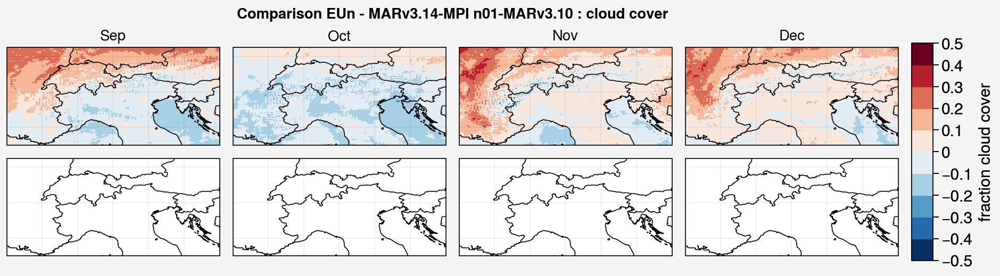

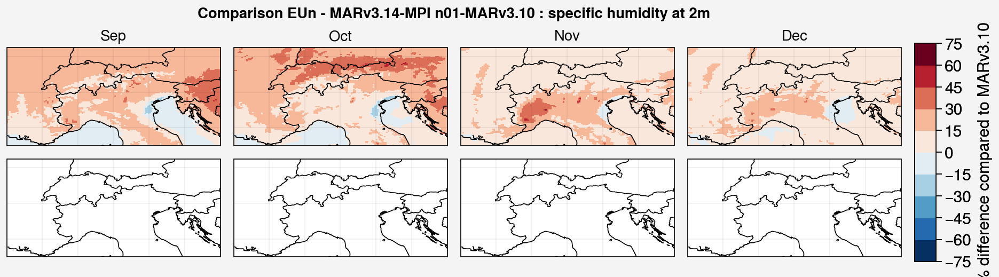

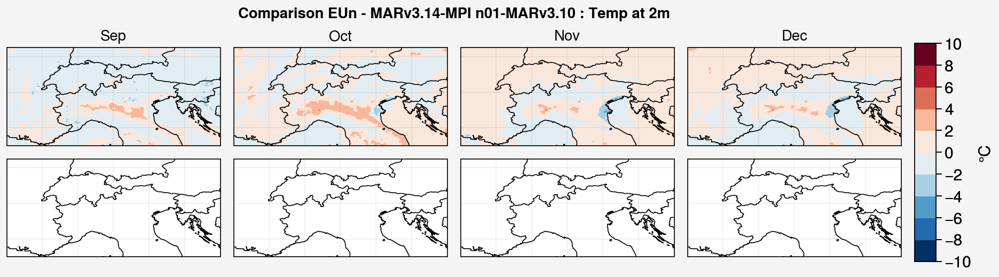

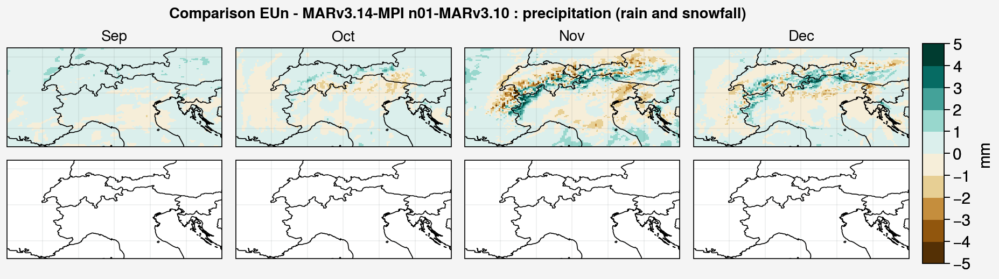

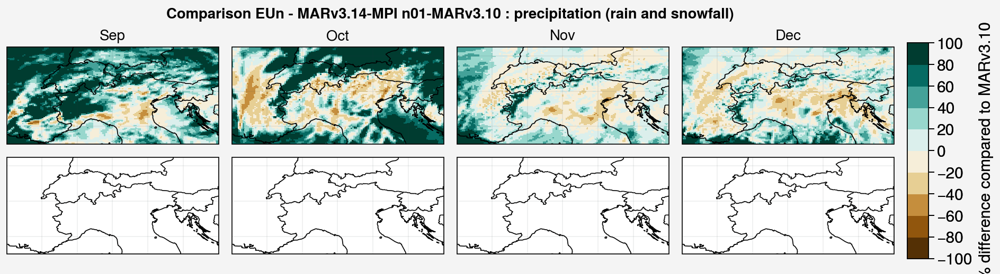

In [14]:
var = "CC"
plot_comparison(var= "CC",list_ds = [ds_EUn012014_09_ave[var].mean(axis=0) - ds_EUy2014_month[var][8],
                                     ds_EUn012014_10_ave[var].mean(axis=0) - ds_EUy2014_month[var][9],
                                     ds_EUn012014_11_ave[var].mean(axis=0) - ds_EUy2014_month[var][10],
                                     ds_EUn012014_12_ave[var].mean(axis=0) - ds_EUy2014_month[var][11]],
                months = ['Sep','Oct','Nov','Dec'],min = -0.5,max = 0.5,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'Comparison EUn - MARv3.14-MPI n01-MARv3.10 : cloud cover',ds_size=ds)

var = "QQz"
plot_comparison(var= "QQz",list_ds = [100*(ds_EUn012014_09_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var][8,0])/ds_EUy2014_month[var][8,0],
                                      100*(ds_EUn012014_10_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var][9,0])/ds_EUy2014_month[var][9,0],
                                      100*(ds_EUn012014_11_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var][10,0])/ds_EUy2014_month[var][10,0],
                                      100*(ds_EUn012014_12_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var][11,0])/ds_EUy2014_month[var][11,0]],
                months = ['Sep','Oct','Nov','Dec'],min = -75,max = 75,colormap = 'RdBu_r',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUn - MARv3.14-MPI n01-MARv3.10 : specific humidity at 2m',ds_size=ds)

var = "TTz"
plot_comparison(var= "TTz",list_ds = [ds_EUn012014_09_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var].isel(ztqlev=0)[8],
                                      ds_EUn012014_10_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var].isel(ztqlev=0)[9],
                                      ds_EUn012014_11_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var].isel(ztqlev=0)[10],
                                      ds_EUn012014_12_ave[var].isel(ztqlev=0).mean(axis=0) - ds_EUy2014_month[var].isel(ztqlev=0)[11]],
                months = ['Sep','Oct','Nov','Dec'],min = -10,max = 10,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'Comparison EUn - MARv3.14-MPI n01-MARv3.10 : Temp at 2m',ds_size=ds)

var = "precip"
list_ds1 = [ds_EUn012014_09_ave[var].groupby('time.day').sum(),ds_EUn012014_10_ave[var].groupby('time.day').sum(),ds_EUn012014_11_ave[var].groupby('time.day').sum(),
            ds_EUn012014_12_ave[var].groupby('time.day').sum()]
plot_comparison(var= "precip",list_ds = [list_ds1[0].mean(axis=0) - ds_EUy2014_month[var][8],
                                         list_ds1[1].mean(axis=0) - ds_EUy2014_month[var][9],
                                         list_ds1[2].mean(axis=0) - ds_EUy2014_month[var][10],
                                         list_ds1[3].mean(axis=0) - ds_EUy2014_month[var][11]],
                months = ['Sep','Oct','Nov','Dec'],min = -5,max = 5,colormap = 'BrBG',label_var = 'mm',
                suptitle_var = 'Comparison EUn - MARv3.14-MPI n01-MARv3.10 : precipitation (rain and snowfall)',ds_size=ds)

var = "precip"
list_ds1 = [ds_EUn012014_09_ave[var].groupby('time.day').sum(),ds_EUn012014_10_ave[var].groupby('time.day').sum(),ds_EUn012014_11_ave[var].groupby('time.day').sum(),
            ds_EUn012014_12_ave[var].groupby('time.day').sum()]
plot_comparison(var= "precip",list_ds = [100*(list_ds1[0].mean(axis=0) - ds_EUy2014_month[var][8])/ds_EUy2014_month[var][8],
                                         100*(list_ds1[1].mean(axis=0) - ds_EUy2014_month[var][9])/ds_EUy2014_month[var][9],
                                         100*(list_ds1[2].mean(axis=0) - ds_EUy2014_month[var][10])/ds_EUy2014_month[var][10],
                                         100*(list_ds1[3].mean(axis=0) - ds_EUy2014_month[var][11])/ds_EUy2014_month[var][11]],
                months = ['Sep','Oct','Nov','Dec'],min = -100,max = 100,colormap = 'BrBG',label_var = '% difference compared to MARv3.10',
                suptitle_var = 'Comparison EUn - MARv3.14-MPI n01-MARv3.10 : precipitation (rain and snowfall)',ds_size=ds)

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

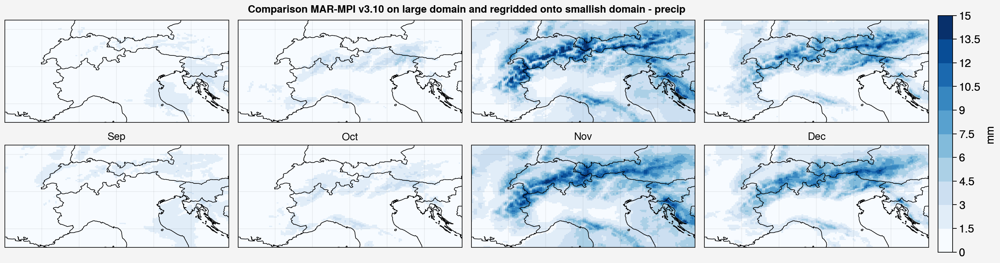

In [25]:
f, axs = pplt.subplots(proj='cyl',axwidth=3,ncols=4,nrows=2,axheight=1.5)

months = ['Sep','Oct','Nov','Dec']

ds_list = [ds_EUn012014_09_ave, ds_EUn012014_10_ave, ds_EUn012014_11_ave, ds_EUn012014_12_ave]

for mon in range(4):
    ax=axs[mon]
    m = ax.pcolormesh(ds.LON,ds.LAT,ds_EUy2014_month.precip[mon+8],levels=np.linspace(0,15,11),cmap='Blues')
    
    ax=axs[mon+4]
    m = ax.pcolormesh(ds.LON,ds.LAT,ds_list[mon].precip.groupby('time.day').sum().mean(axis=0),levels=np.linspace(0,15,11),cmap='Blues')
    ax.format(title=months[mon])


f.colorbar(m,label= 'mm',labelsize='large',ticklabelsize='large')
axs.format(**multiplot_format,suptitle='Comparison MAR-MPI v3.10 on large domain and regridded onto smallish domain - precip')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

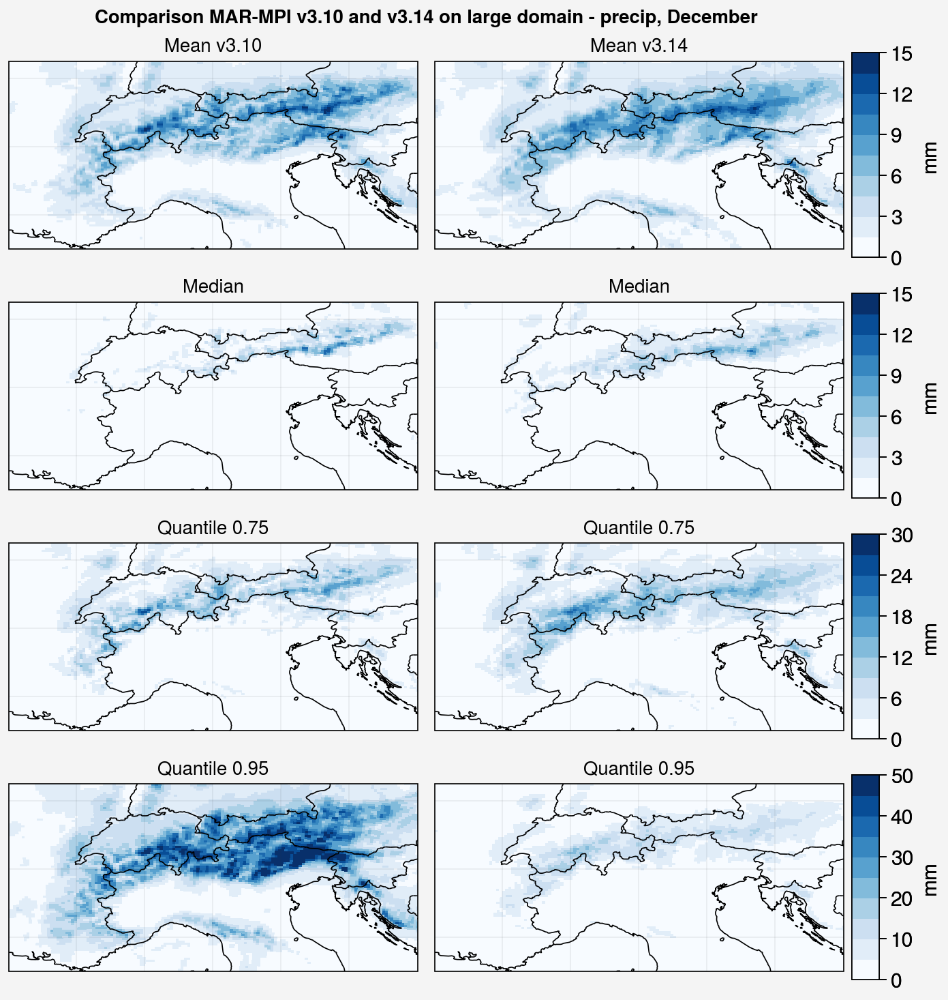

In [40]:
f, axs = pplt.subplots(proj='cyl',axwidth=3,ncols=2,nrows=4,axheight=1.5)

months = ['Sep','Oct','Nov','Dec']
q1 = 0.75
q2 = 0.95

ds_12 = ds_EUn012014_12_ave.precip.resample(time='D').sum()

m = axs[0,0].pcolormesh(ds.LON,ds.LAT,ds_EUy2014.precip.groupby('time.month').mean()[11],levels=np.linspace(0,15,11),cmap='Blues')
m = axs[0,1].pcolormesh(ds.LON,ds.LAT,ds_12.mean(axis=0),levels=np.linspace(0,15,11),cmap='Blues')
axs[0,1].colorbar(m,label= 'mm',labelsize='large',ticklabelsize='large')
axs[0,0].format(title='Mean v3.10')
axs[0,1].format(title='Mean v3.14')

m = axs[1,0].pcolormesh(ds.LON,ds.LAT,ds_EUy2014.precip.groupby('time.month').median()[11],levels=np.linspace(0,15,11),cmap='Blues')
m = axs[1,1].pcolormesh(ds.LON,ds.LAT,ds_12.median(axis=0),levels=np.linspace(0,15,11),cmap='Blues')
axs[1,1].colorbar(m,label= 'mm',labelsize='large',ticklabelsize='large')
axs[1,0].format(title='Median')
axs[1,1].format(title='Median')

m = axs[2,0].pcolormesh(ds.LON,ds.LAT,ds_EUy2014.precip.groupby('time.month').quantile(q1)[11],levels=np.linspace(0,30,11),cmap='Blues')
m = axs[2,1].pcolormesh(ds.LON,ds.LAT,ds_12.groupby('time.month').quantile(q1)[0],levels=np.linspace(0,30,11),cmap='Blues')
axs[2,1].colorbar(m,label= 'mm',labelsize='large',ticklabelsize='large')
axs[2,0].format(title=f'Quantile {q1}')
axs[2,1].format(title=f'Quantile {q1}')

m = axs[3,0].pcolormesh(ds.LON,ds.LAT,ds_EUy2014.precip.groupby('time.month').quantile(q2)[11],levels=np.linspace(0,50,11),cmap='Blues')
m = axs[3,1].pcolormesh(ds.LON,ds.LAT,ds_12.groupby('time.month').quantile(q1)[0],levels=np.linspace(0,50,11),cmap='Blues')
axs[3,1].colorbar(m,label= 'mm',labelsize='large',ticklabelsize='large')
axs[3,0].format(title=f'Quantile {q2}')
axs[3,1].format(title=f'Quantile {q2}')

#f.colorbar(m,label= 'mm',labelsize='large',ticklabelsize='large')
axs.format(**multiplot_format,suptitle='Comparison MAR-MPI v3.10 and v3.14 on large domain - precip, December')

In [36]:
ds_12.groupby('time.month').quantile(q1)

<xarray.DataArray 'precip' (month: 1, y: 126, x: 201)>
array([[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 6.05865149e-03, 7.49568734e-03, ...,
         2.07542873e-03, 8.06207012e-04, 0.00000000e+00],
        [0.00000000e+00, 1.25841512e-02, 1.24151707e-02, ...,
         7.46955257e-03, 2.46308628e-03, 0.00000000e+00],
        ...,
        [0.00000000e+00, 8.97278070e-01, 8.61803085e-01, ...,
         1.31359398e+00, 8.98827314e-01, 0.00000000e+00],
        [0.00000000e+00, 7.54424840e-01, 7.20875800e-01, ...,
         7.12187141e-01, 5.05225301e-01, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]]])
Coordinates:
  * x         (x) float32 -483.0 -476.0 -469.0 -462.0 ... 903.0 910.0 917.0
  * y         (y) float32 -308.0 -301.0 -294.0 -287.0 ... 553.0 560.0 567.0
    quantile  float64 0.75
  * month     (month) int64 12